In [1]:
"""
Import modules
"""

import pathlib
import numpy as np

import SimpleITK as sitk
import matplotlib.pyplot as plt

from platipy.imaging.visualisation.tools import ImageVisualiser

from platipy.imaging.registration.registration import (
    initial_registration,
    fast_symmetric_forces_demons_registration,
    transform_propagation,
    apply_field
)

%matplotlib notebook

In [2]:
#PET/CT tumour segmentation:
#read in PET and CT code and register them. Visualise with correct cut
image_ct_0=sitk.ReadImage("/home/alicja/Documents/WES_007/IMAGES/WES_007_1_20180814_CT_10_PETCT_WBHDIN_ONC_3.nii.gz")
image_pt_0_raw=sitk.ReadImage("/home/alicja/Documents/WES_007/IMAGES/WES_007_1_20180814_PT_AC_4.nii.gz")

image_pt_0=sitk.Resample(image_pt_0_raw, image_ct_0)

In [3]:
print(image_ct_0.GetSize())
print(image_pt_0_raw.GetSpacing())

(512, 512, 368)
(4.0728302001953125, 4.0728302001953125, 1.5)


<IPython.core.display.Javascript object>


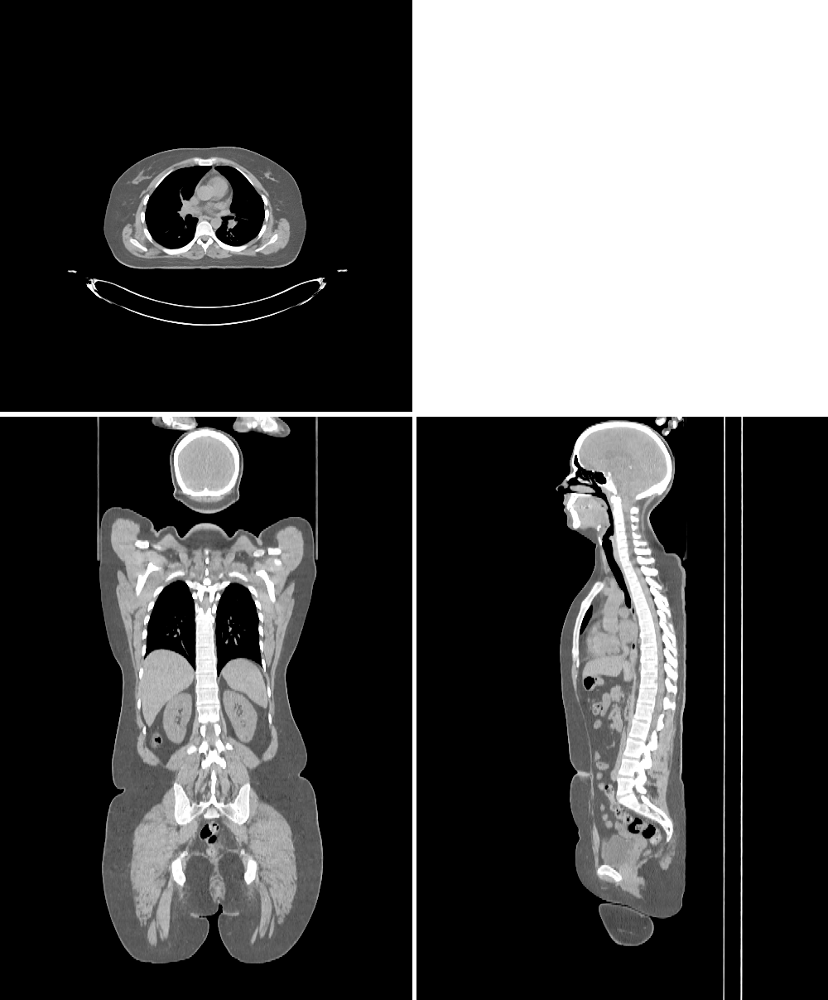

In [4]:
vis = ImageVisualiser(image_ct_0, cut=[240,290,256], window=[-250, 500])  #original cut = [174,290,256]
fig = vis.show()

<IPython.core.display.Javascript object>


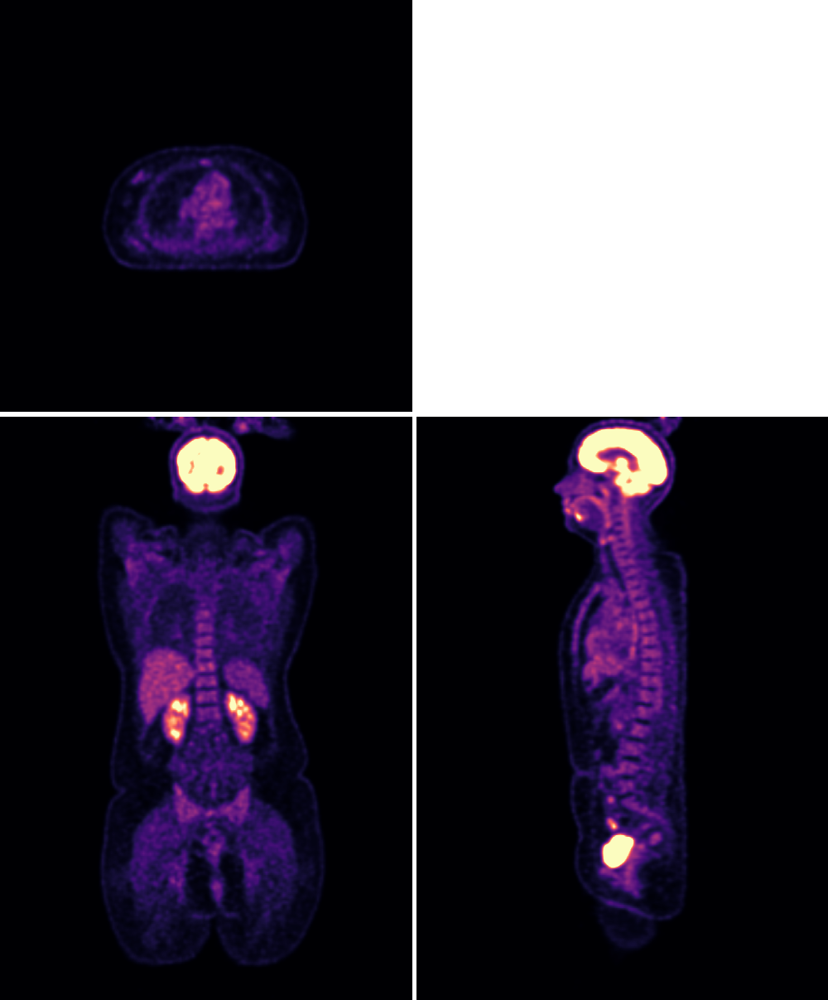

In [5]:
vis = ImageVisualiser(image_pt_0, colormap=plt.cm.magma, cut=[240,290,256], window=[0.1, 10000])
fig = vis.show()

<IPython.core.display.Javascript object>


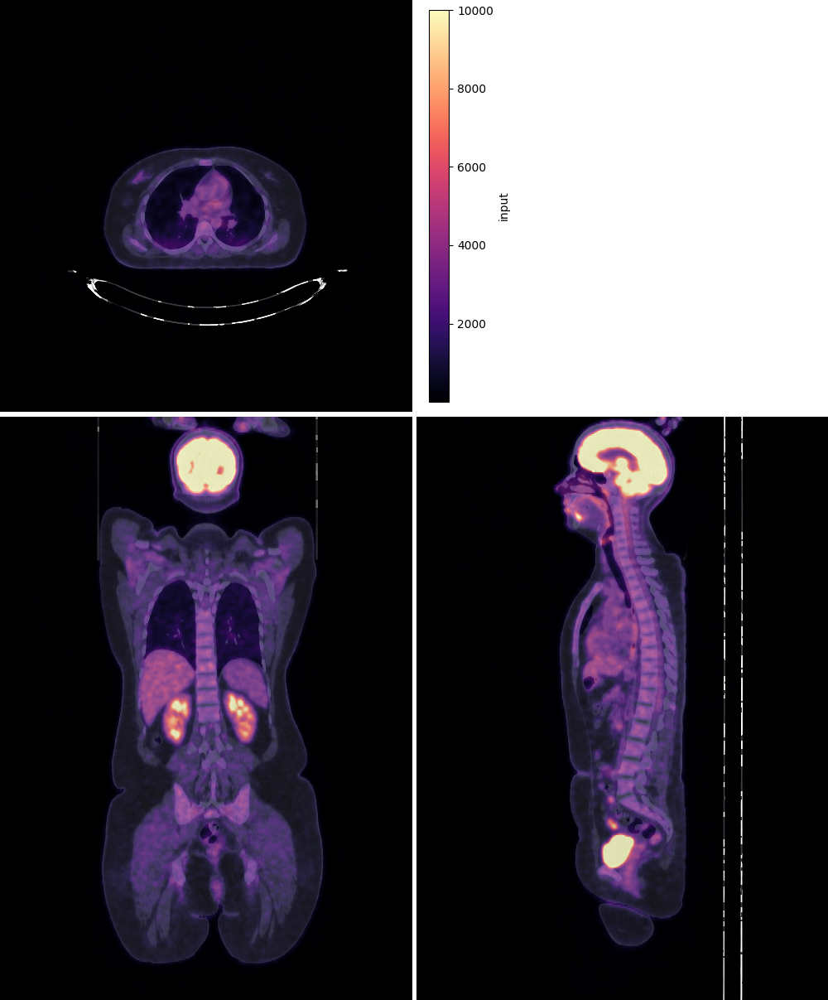

In [6]:
vis = ImageVisualiser(image_ct_0, cut=[240,290,256], window=[-250, 500])
vis.add_scalar_overlay(image_pt_0, colormap=plt.cm.magma, min_value=0.1, max_value=10000)
fig = vis.show()

In [7]:
image_ct_plan = sitk.ReadImage("/home/alicja/Documents/WES_007/IMAGES/WES_007_6_20180925_CT_15.nii.gz")
contour_rbreast_plan = sitk.ReadImage("/home/alicja/Documents/WES_007/STRUCTURES/WES_007_6_20180925_RTSTRUCT_WHOLE_BREAST_CTV_0.nii.gz")

<IPython.core.display.Javascript object>


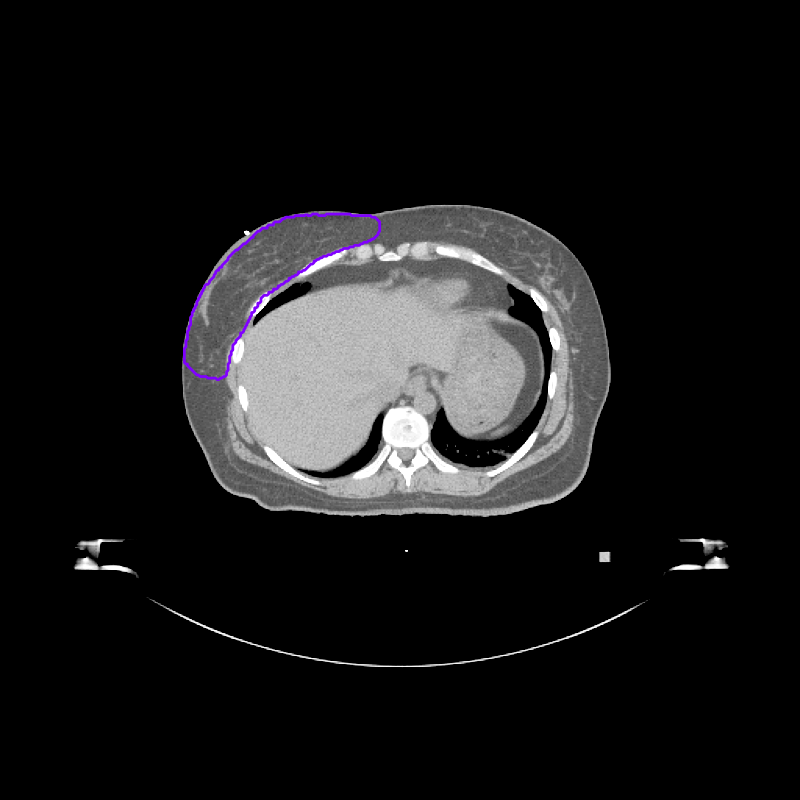

/home/alicja/.local/lib/python3.8/site-packages/platipy/imaging/visualisation/tools.py:1409: UserWarning: No contour levels were found within the data range.
  ax.contour(
/home/alicja/.local/lib/python3.8/site-packages/platipy/imaging/visualisation/tools.py:1409: UserWarning: The following kwargs were not used by contour: 'label'
  ax.contour(


In [8]:
vis = ImageVisualiser(image_ct_plan, axis='z', cut=60, window=[-250, 500], figure_size_in=8)
vis.add_contour({'R BREAST' :contour_rbreast_plan})
fig = vis.show()

In [11]:
image_ct_plan_to_0_rigid, tfm_plan_to_0_rigid = initial_registration(
    image_ct_0,
    image_ct_plan,
    options={
        'shrink_factors': [8,4],
        'smooth_sigmas': [0,0],
        'sampling_rate': 0.5,
        'final_interp': 2,
        'metric': 'mean_squares',
        'optimiser': 'gradient_descent_line_search',
        'number_of_iterations': 25},
    reg_method='Rigid')

<IPython.core.display.Javascript object>


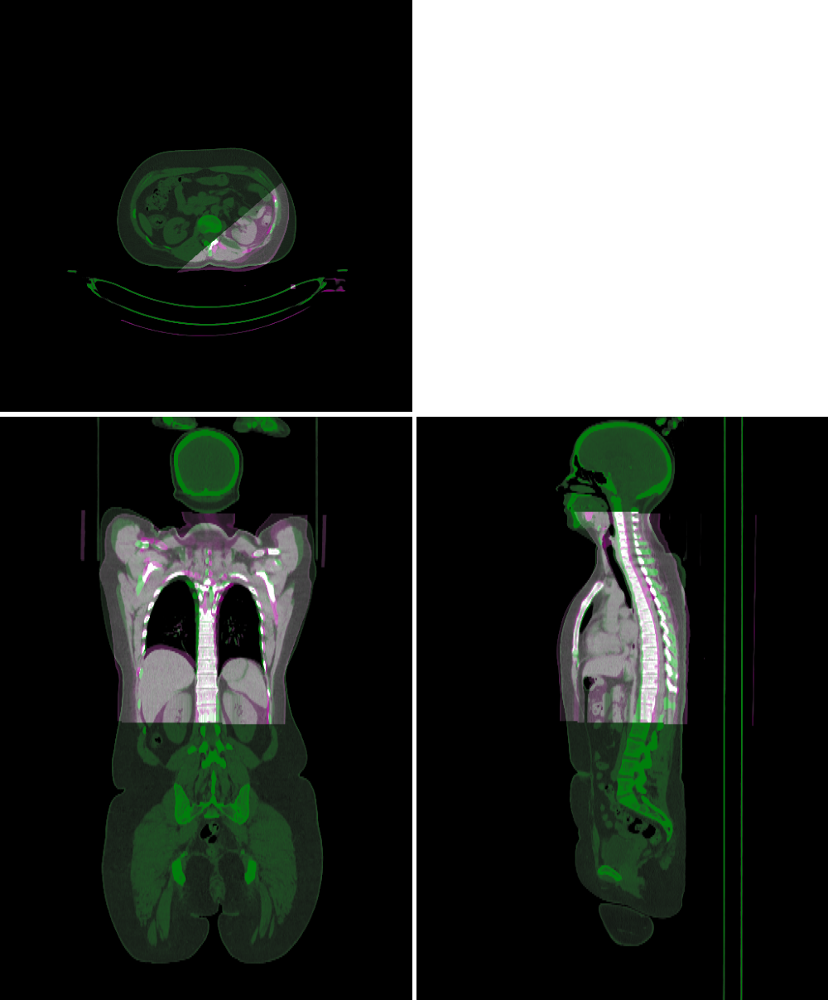

In [12]:
vis = ImageVisualiser(image_ct_0, cut=[174,290,256], window=[-250, 500]) #this doesn't look ideal
vis.add_comparison_overlay(image_ct_plan_to_0_rigid)
fig = vis.show()

In [13]:
image_ct_plan_to_0_dir, tfm_plan_to_0_dir = fast_symmetric_forces_demons_registration(
    image_ct_0,
    image_ct_plan_to_0_rigid,
    resolution_staging=[4,2],
    iteration_staging=[10,10]
)

<IPython.core.display.Javascript object>


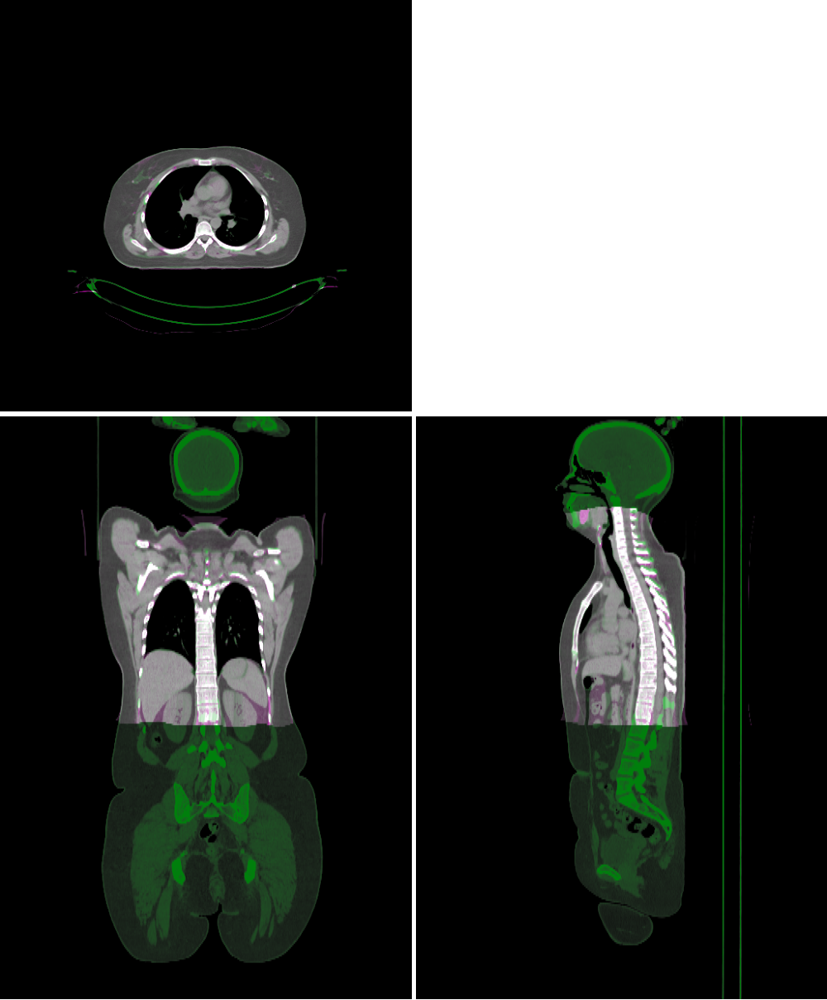

In [14]:
vis = ImageVisualiser(image_ct_0, cut=[240,290,256], window=[-250, 500]) #cut=[240,290,256]
vis.add_comparison_overlay(image_ct_plan_to_0_dir)
fig = vis.show()

In [15]:
contour_rbreast_plan_to_0_rigid = transform_propagation(
    image_ct_0,
    contour_rbreast_plan,
    tfm_plan_to_0_rigid,
    structure=True
)

contour_rbreast_plan_to_0_dir = apply_field(
    contour_rbreast_plan_to_0_rigid,
    tfm_plan_to_0_dir,
    structure=True
)

<IPython.core.display.Javascript object>


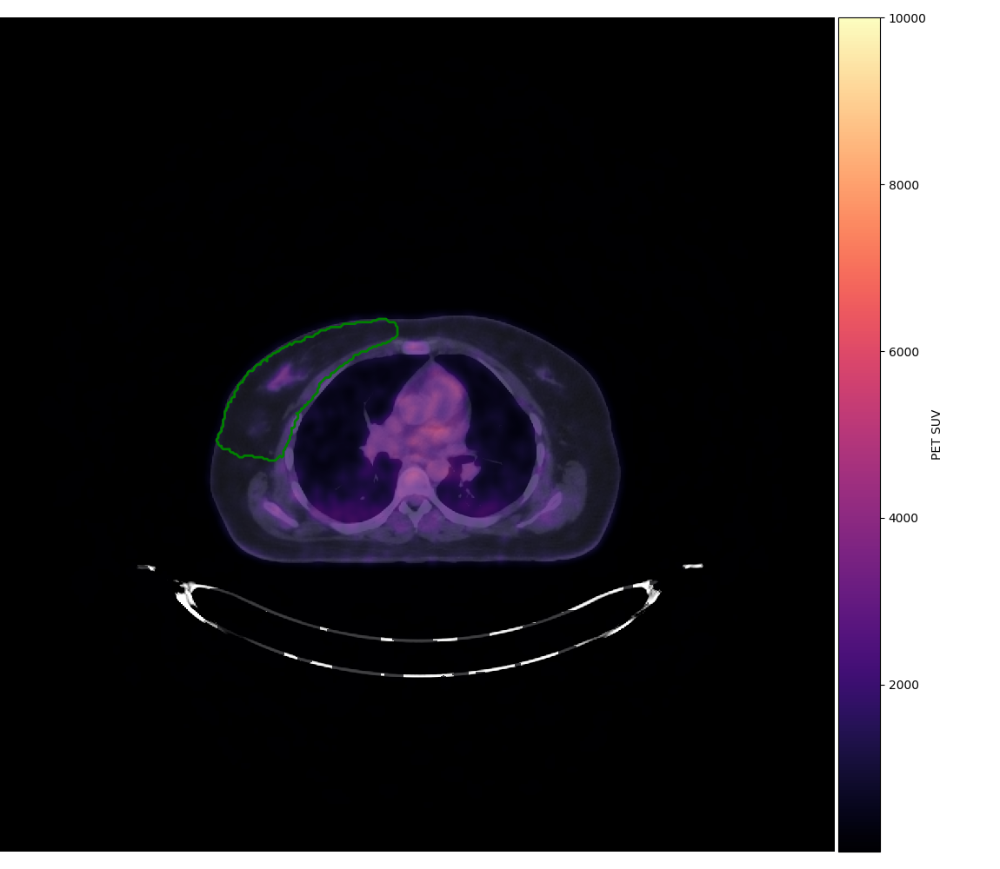

In [16]:
vis = ImageVisualiser(image_ct_0, axis='z', cut=240, window=[-250, 500])
vis.add_scalar_overlay(image_pt_0, name='PET SUV', colormap=plt.cm.magma, min_value=0.1, max_value=10000)
vis.add_contour(contour_rbreast_plan_to_0_dir, name='R BREAST', color='g') #not being overlaid..
fig = vis.show()

<IPython.core.display.Javascript object>


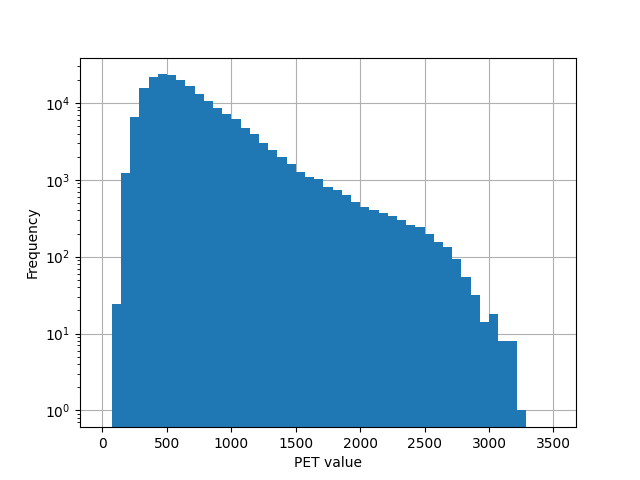

In [17]:
#use structure information for breast to mask out all but the breast area (create new array with everything but
#this area set to 0)
masked_pet_rbreast = sitk.Mask(image_pt_0, contour_rbreast_plan_to_0_dir)

values = sitk.GetArrayViewFromImage(masked_pet_rbreast).flatten()

fig, ax = plt.subplots(1,1)
ax.hist(values, bins=np.linspace(1,3500,50), histtype='stepfilled', lw=2)
ax.set_yscale('log')
ax.grid()
ax.set_axisbelow(True)
ax.set_xlabel('PET value')
ax.set_ylabel('Frequency')
fig.show()

In [18]:
sitk.WriteImage(masked_pet_rbreast, "masked_pet_rbreast_WES_007_1.nii.gz")

In [19]:
test=sitk.ReadImage("masked_pet_rbreast_WES_007_1.nii.gz")

In [21]:
vis=ImageVisualiser(test)
fig=vis.show(test)

interactive(children=(IntSlider(value=256, description='sagittal_slice', max=512), Output()), _dom_classes=('w…

In [17]:
def mode1(x):
    values, counts = np.unique(x, return_counts=True)
    m = counts.argmax()
    return values[m], counts[m]

In [18]:
masked_pet_rbreast_arr=sitk.GetArrayFromImage(masked_pet_rbreast)
masked_pet_rbreast_arr=masked_pet_rbreast_arr.flatten() #need to round the values to the nearest integer?
masked_pet_rbreast_arr=np.rint(masked_pet_rbreast_arr)
mode=mode1(masked_pet_rbreast_arr[masked_pet_rbreast_arr>0])
print(mode)

(480.0, 373)


In [19]:
p = np.percentile(masked_pet_rbreast_arr[masked_pet_rbreast_arr>0], 95) # return 95th percentile
print(p)

1459.0


In [20]:
max_val=np.max(masked_pet_rbreast_arr)
print(max_val)

3245.0


In [21]:
from scipy import stats

arr=np.array([[1,2,3],[5,2,4]])
m=stats.mode(arr, axis=None)
print(m)

ModeResult(mode=array([2]), count=array([2]))


In [3]:
def PET_segmentation(ct="/home/alicja/Documents/WES_007/IMAGES/WES_007_1_20180814_CT_10_PETCT_WBHDIN_ONC_3.nii.gz",
                     pet="/home/alicja/Documents/WES_007/IMAGES/WES_007_1_20180814_PT_AC_4.nii.gz", 
                     ct_plan="/home/alicja/Documents/WES_007/IMAGES/WES_007_6_20180925_CT_15.nii.gz", 
                     contour_breast_plan="/home/alicja/Documents/WES_007/STRUCTURES/WES_007_6_20180925_RTSTRUCT_WHOLE_BREAST_CTV_0.nii.gz",
                     mask_output_file="masked_pet_rbreast_WES_007_1.nii.gz"):
    
    ct=sitk.ReadImage(ct)
    pet_raw=sitk.ReadImage(pet)

    pet=sitk.Resample(pet_raw, ct)
    
    ct_plan = sitk.ReadImage(ct_plan)
    contour_breast_plan = sitk.ReadImage(contour_breast_plan)
    
    #vis = ImageVisualiser(ct_plan, axis='z', cut=60, window=[-250, 500], figure_size_in=8)
    #vis.add_contour({'BREAST' :contour_breast_plan})
    #fig = vis.show()
    
    image_ct_plan_to_0_rigid, tfm_plan_to_0_rigid = initial_registration(
        ct,
        ct_plan,
        options={
            'shrink_factors': [8,4],
            'smooth_sigmas': [0,0],
            'sampling_rate': 0.5,
            'final_interp': 2,
            'metric': 'mean_squares',
            'optimiser': 'gradient_descent_line_search',
            'number_of_iterations': 25},
        reg_method='Rigid')
    
    image_ct_plan_to_0_dir, tfm_plan_to_0_dir = fast_symmetric_forces_demons_registration(
        ct,
        image_ct_plan_to_0_rigid,
        resolution_staging=[4,2],
        iteration_staging=[10,10]
    )
    
    #vis = ImageVisualiser(ct, cut=[240,290,256], window=[-250, 500])
    #vis.add_comparison_overlay(image_ct_plan_to_0_dir)
    #fig = vis.show()
    
    contour_breast_plan_to_0_rigid = transform_propagation(
        ct,
        contour_breast_plan,
        tfm_plan_to_0_rigid,
        structure=True
    )

    contour_breast_plan_to_0_dir = apply_field(
        contour_breast_plan_to_0_rigid,
        tfm_plan_to_0_dir,
        structure=True
    )
    
    #vis = ImageVisualiser(ct, axis='z', cut=240, window=[-250, 500])
    #vis.add_scalar_overlay(pet, name='PET SUV', colormap=plt.cm.magma, min_value=0.1, max_value=10000)
    #vis.add_contour(contour_breast_plan_to_0_dir, name='BREAST', color='g')
    #fig = vis.show()
    
    masked_pet_breast = sitk.Mask(pet, contour_breast_plan_to_0_dir)
    sitk.WriteImage(masked_pet_breast, mask_output_file)

    values = sitk.GetArrayViewFromImage(masked_pet_breast).flatten()

    fig, ax = plt.subplots(1,1)
    ax.hist(values, bins=np.linspace(1,7000,50), histtype='stepfilled', lw=2)
    ax.set_yscale('log')
    ax.grid()
    ax.set_axisbelow(True)
    ax.set_xlabel('PET value')
    ax.set_ylabel('Frequency')
    fig.show()
    
    def mode1(x):
        values, counts = np.unique(x, return_counts=True)
        m = counts.argmax()
        return values[m], counts[m]
    
    masked_pet_breast_arr=sitk.GetArrayFromImage(masked_pet_breast)
    masked_pet_breast_arr=masked_pet_breast_arr.flatten()
    masked_pet_breast_arr=np.rint(masked_pet_breast_arr)
    mode=mode1(masked_pet_breast_arr[masked_pet_breast_arr>0])
    p = np.percentile(masked_pet_breast_arr[masked_pet_breast_arr>0], 95) # return 95th percentile
    max_val=np.max(masked_pet_breast_arr)

    return mode, p, max_val

In [ ]:
mode,p,max_val=PET_segmentation(ct="/home/alicja/Documents/WES_007/IMAGES/WES_007_1_20180814_CT_10_PETCT_WBHDIN_ONC_3.nii.gz",
                     pet="/home/alicja/Documents/WES_007/IMAGES/WES_007_1_20180814_PT_AC_4.nii.gz", 
                     ct_plan="/home/alicja/Documents/WES_007/IMAGES/WES_007_6_20180925_CT_15.nii.gz", 
                     contour_breast_plan="/home/alicja/Documents/WES_007/STRUCTURES/WES_007_6_20180925_RTSTRUCT_WHOLE_BREAST_CTV_0.nii.gz",
                     mask_output_file="masked_pet_rbreast_WES_007_1.nii.gz")

In [1]:
print(mode,p,max_val)

<IPython.core.display.Javascript object>


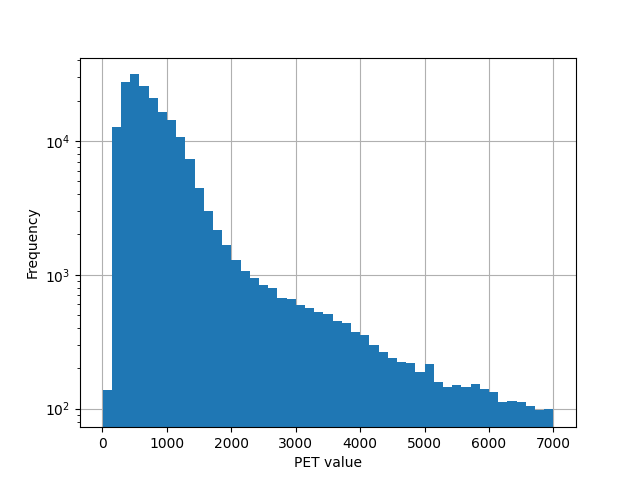

In [4]:
mode1,p1,max_val1=PET_segmentation(ct="/home/alicja/Documents/WES_007/IMAGES/WES_007_2_20180321_CT_10_PETCT_WBHDIN_ONC_3.nii.gz",
                     pet="/home/alicja/Documents/WES_007/IMAGES/WES_007_2_20180321_PT_AC_4.nii.gz", 
                     ct_plan="/home/alicja/Documents/WES_007/IMAGES/WES_007_6_20180925_CT_15.nii.gz", 
                     contour_breast_plan="/home/alicja/Documents/WES_007/STRUCTURES/WES_007_6_20180925_RTSTRUCT_WHOLE_BREAST_CTV_0.nii.gz",
                     mask_output_file="masked_pet_rbreast_WES_007_2.nii.gz")

In [5]:
print(mode1,p1,max_val1)

(472.0, 270) 3292.399999999994 37749.0


<IPython.core.display.Javascript object>


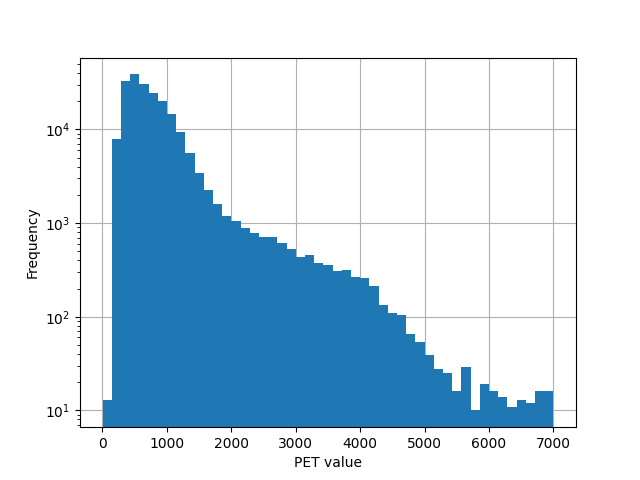

In [6]:
mode2,p2,max_val2=PET_segmentation(ct="/home/alicja/Documents/WES_007/IMAGES/WES_007_4_20180502_CT_10_PETCT_WBHDIN_ONC_3.nii.gz",
                     pet="/home/alicja/Documents/WES_007/IMAGES/WES_007_4_20180502_PT_AC_4.nii.gz", 
                     ct_plan="/home/alicja/Documents/WES_007/IMAGES/WES_007_6_20180925_CT_15.nii.gz", 
                     contour_breast_plan="/home/alicja/Documents/WES_007/STRUCTURES/WES_007_6_20180925_RTSTRUCT_WHOLE_BREAST_CTV_0.nii.gz",
                     mask_output_file="masked_pet_rbreast_WES_007_4.nii.gz")

In [7]:
print(mode2,p2,max_val2)

(459.0, 323) 1876.0 9234.0


<IPython.core.display.Javascript object>


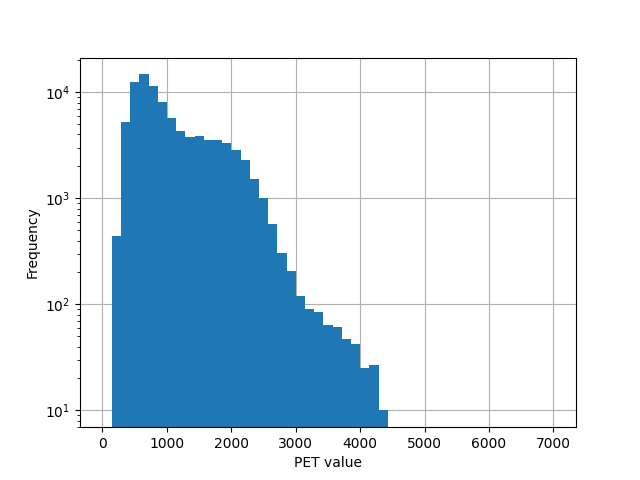

In [8]:
mode,p,max_val=PET_segmentation(ct="/home/alicja/Documents/WES_005/IMAGES/WES_005_0_20180202_CT_10_PETCT_WBHDIN_ONC_3.nii.gz",
                     pet="/home/alicja/Documents/WES_005/IMAGES/WES_005_0_20180202_PT_AC_7.nii.gz", 
                     ct_plan="/home/alicja/Documents/WES_005/IMAGES/WES_005_6_20180319_CT_10.nii.gz", 
                     contour_breast_plan="/home/alicja/Documents/WES_005/STRUCTURES/WES_005_6_RTSTRUCT_WHOLE_BREAST_CTV.nii.gz",
                     mask_output_file="masked_pet_breast_WES_005_0.nii.gz")

In [12]:
print(mode,p,max_val)

(555.0, 130) 2260.649999999994 4407.0


<IPython.core.display.Javascript object>


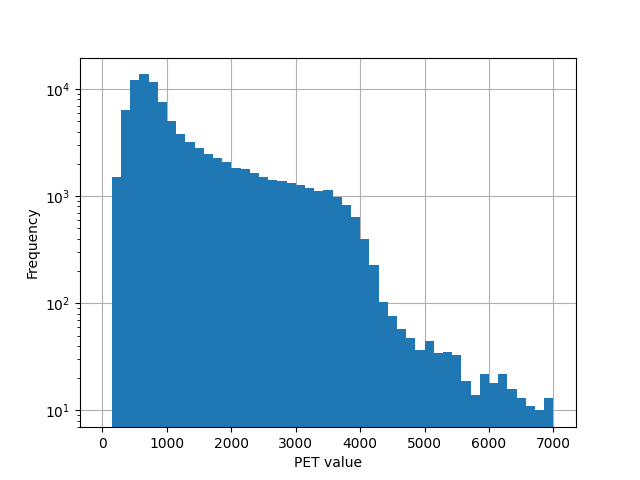

In [9]:
mode1,p1,max_val1=PET_segmentation(ct="/home/alicja/Documents/WES_005/IMAGES/WES_005_2_20170911_CT_10_PETCT_WBHDIN_ONC_3.nii.gz",
                     pet="/home/alicja/Documents/WES_005/IMAGES/WES_005_2_20170911_PT_AC_4.nii.gz", 
                     ct_plan="/home/alicja/Documents/WES_005/IMAGES/WES_005_6_20180319_CT_10.nii.gz", 
                     contour_breast_plan="/home/alicja/Documents/WES_005/STRUCTURES/WES_005_6_RTSTRUCT_WHOLE_BREAST_CTV.nii.gz",
                     mask_output_file="masked_pet_breast_WES_005_2.nii.gz")

In [2]:
ct="/home/alicja/Documents/WES_005/IMAGES/WES_005_2_20170911_CT_10_PETCT_WBHDIN_ONC_3.nii.gz"
pet="/home/alicja/Documents/WES_005/IMAGES/WES_005_2_20170911_PT_AC_4.nii.gz"
ct_plan="/home/alicja/Documents/WES_005/IMAGES/WES_005_6_20180319_CT_10.nii.gz"
contour_breast_plan="/home/alicja/Documents/WES_005/STRUCTURES/WES_005_6_RTSTRUCT_WHOLE_BREAST_CTV.nii.gz"
mask_output_file="masked_pet_breast_WES_005_2.nii.gz"

ct=sitk.ReadImage(ct)
pet_raw=sitk.ReadImage(pet)

pet=sitk.Resample(pet_raw, ct)

ct_plan = sitk.ReadImage(ct_plan)
contour_breast_plan = sitk.ReadImage(contour_breast_plan)

In [11]:
image_ct_plan_to_0_rigid, tfm_plan_to_0_rigid = initial_registration(
    ct,
    ct_plan,
    options={
        'shrink_factors': [8,4],
        'smooth_sigmas': [0,0],
        'sampling_rate': 0.5,
        'final_interp': 2,
        'metric': 'mean_squares',
        'optimiser': 'gradient_descent_line_search',
        'number_of_iterations': 25},
    reg_method='Rigid')

<IPython.core.display.Javascript object>


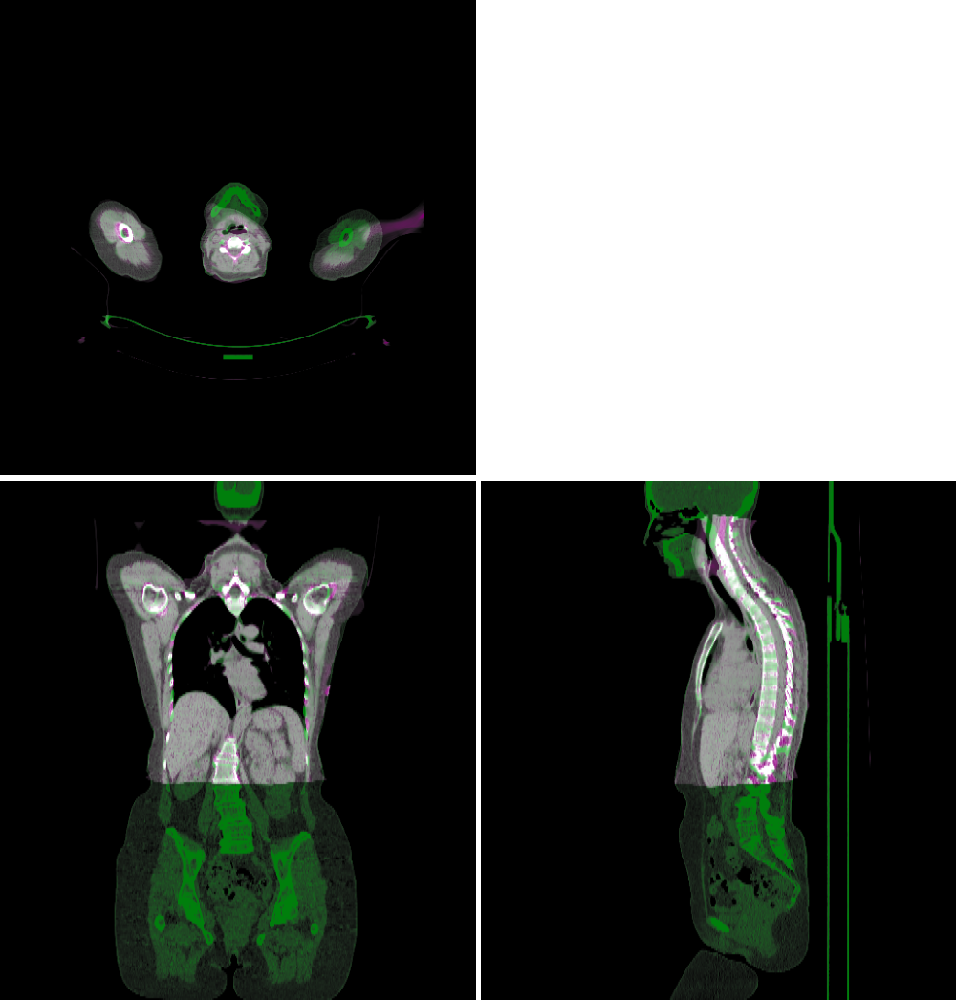

In [12]:
image_ct_plan_to_0_dir, tfm_plan_to_0_dir = fast_symmetric_forces_demons_registration(
    ct,
    image_ct_plan_to_0_rigid,
    resolution_staging=[4,2],
    iteration_staging=[10,10]
)

In [ ]:
vis = ImageVisualiser(ct, cut=[240,290,256], window=[-250, 500])
vis.add_comparison_overlay(image_ct_plan_to_0_dir)
fig = vis.show()

In [13]:
contour_breast_plan_to_0_rigid = transform_propagation(
    ct,
    contour_breast_plan,
    tfm_plan_to_0_rigid,
    structure=True
)

contour_breast_plan_to_0_dir = apply_field(
    contour_breast_plan_to_0_rigid,
    tfm_plan_to_0_dir,
    structure=True
)

<IPython.core.display.Javascript object>


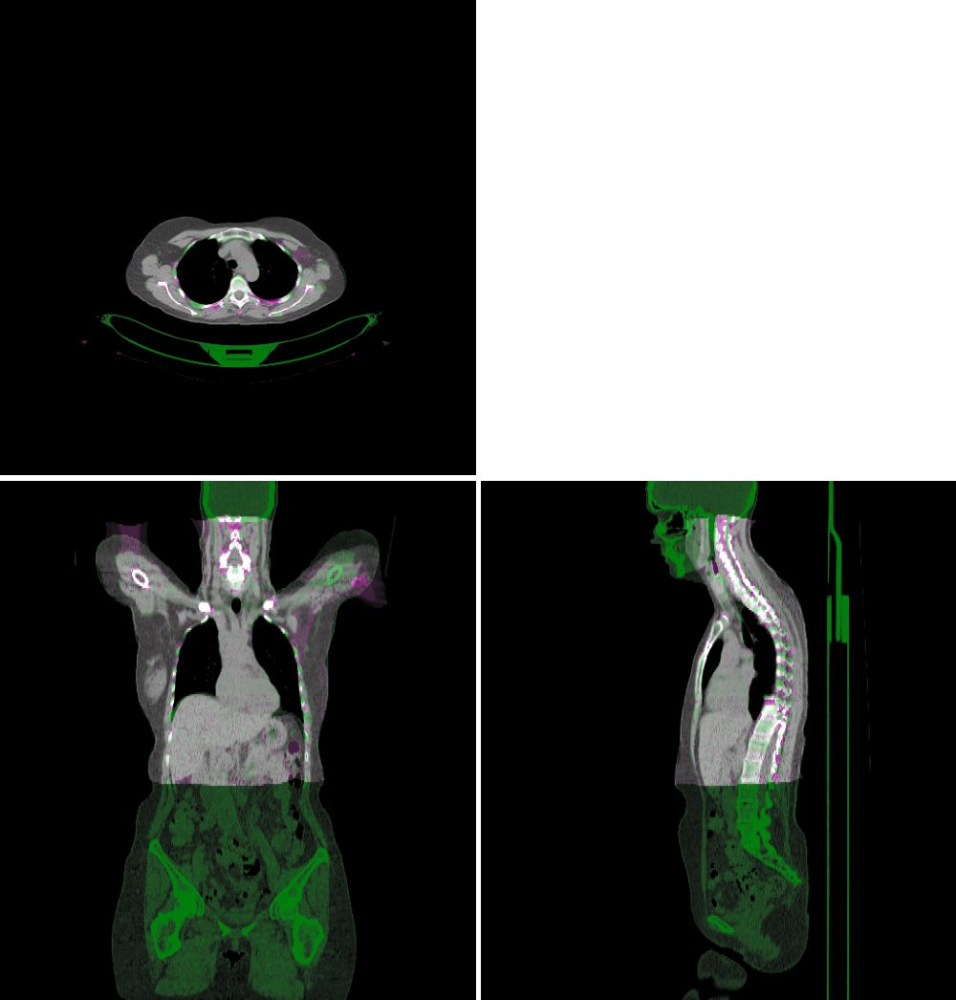

In [19]:
vis = ImageVisualiser(ct, cut=[200,270,246], window=[-250, 500])
vis.add_comparison_overlay(image_ct_plan_to_0_dir)
fig = vis.show()

<IPython.core.display.Javascript object>


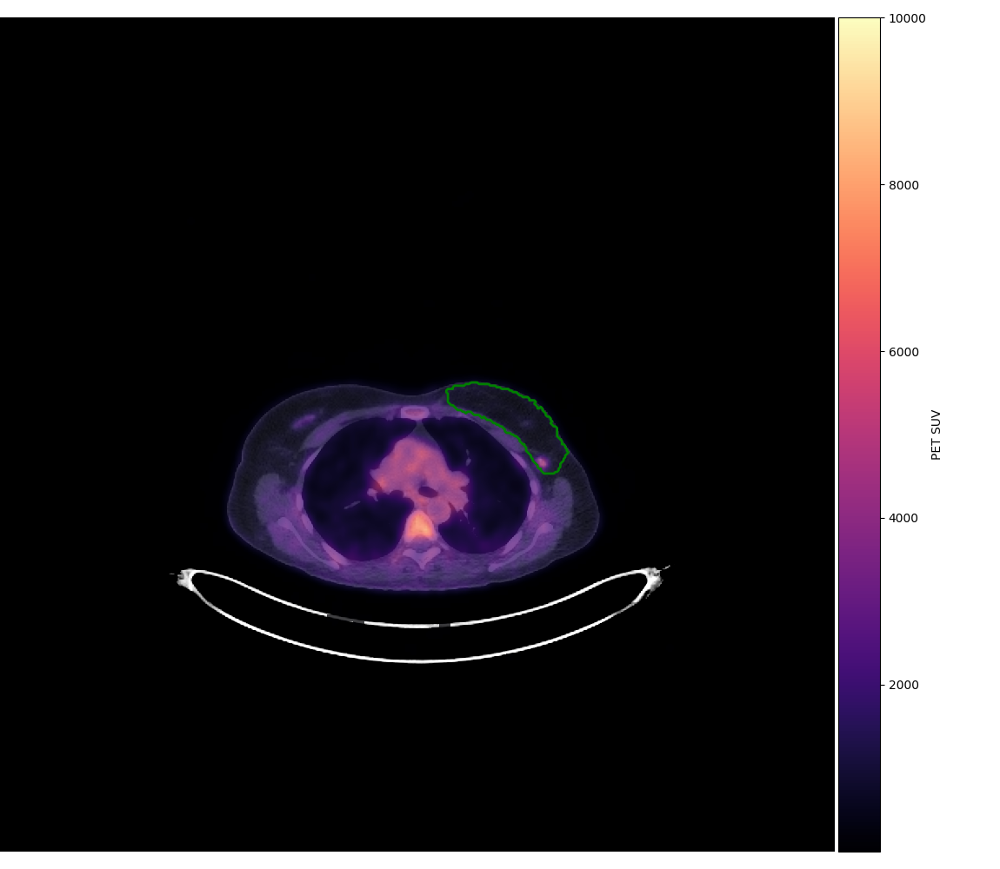

/home/alicja/.local/lib/python3.8/site-packages/platipy/imaging/visualisation/tools.py:1409: UserWarning: No contour levels were found within the data range.
  ax.contour(
/home/alicja/.local/lib/python3.8/site-packages/platipy/imaging/visualisation/tools.py:1409: UserWarning: The following kwargs were not used by contour: 'label'
  ax.contour(


In [20]:
vis = ImageVisualiser(ct, axis='z', cut=190, window=[-250, 500])
vis.add_scalar_overlay(pet, name='PET SUV', colormap=plt.cm.magma, min_value=0.1, max_value=10000)
vis.add_contour(contour_breast_plan_to_0_dir, name='BREAST', color='g')
fig = vis.show()

<IPython.core.display.Javascript object>


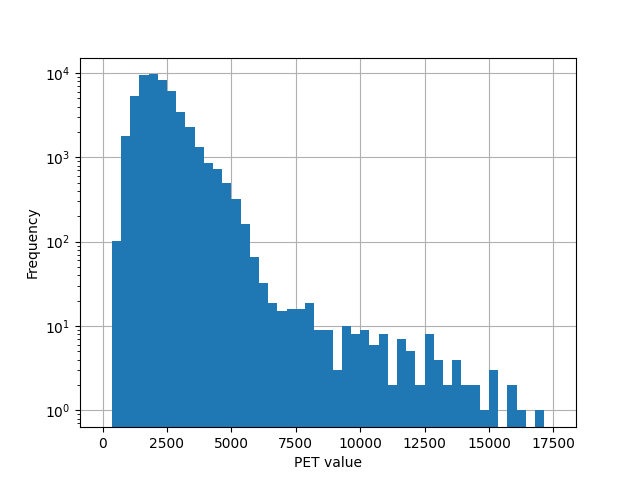

In [27]:
masked_pet_breast = sitk.Mask(pet, contour_breast_plan_to_0_dir)
sitk.WriteImage(masked_pet_breast, "masked_pet_rbreast_WES_005_2.nii.gz")

values = sitk.GetArrayViewFromImage(masked_pet_breast).flatten()

fig, ax = plt.subplots(1,1)
ax.hist(values, bins=np.linspace(1,17500,50), histtype='stepfilled', lw=2)
ax.set_yscale('log')
ax.grid()
ax.set_axisbelow(True)
ax.set_xlabel('PET value')
ax.set_ylabel('Frequency')
fig.show()

In [22]:
def mode1(x):
    values, counts = np.unique(x, return_counts=True)
    m = counts.argmax()
    return values[m], counts[m]
    
masked_pet_breast_arr=sitk.GetArrayFromImage(masked_pet_breast)
masked_pet_breast_arr=masked_pet_breast_arr.flatten()
masked_pet_breast_arr=np.rint(masked_pet_breast_arr)
mode=mode1(masked_pet_breast_arr[masked_pet_breast_arr>0])
p = np.percentile(masked_pet_breast_arr[masked_pet_breast_arr>0], 95) # return 95th percentile
max_val=np.max(masked_pet_breast_arr)

In [23]:
print(mode,p,max_val)

(619.0, 120) 3456.0 8151.0


In [10]:
ct="/home/alicja/Documents/WES_005/IMAGES/WES_005_4_20170718_CT_10_PETCT_WBHDIN_ONC_3.nii.gz"
pet="/home/alicja/Documents/WES_005/IMAGES/WES_005_4_20170718_PT_AC_4.nii.gz"
ct_plan="/home/alicja/Documents/WES_005/IMAGES/WES_005_6_20180319_CT_10.nii.gz"
contour_breast_plan="/home/alicja/Documents/WES_005/STRUCTURES/WES_005_6_RTSTRUCT_WHOLE_BREAST_CTV.nii.gz"

In [11]:
ct=sitk.ReadImage(ct)
pet_raw=sitk.ReadImage(pet)

pet=sitk.Resample(pet_raw, ct)

ct_plan = sitk.ReadImage(ct_plan)
contour_breast_plan = sitk.ReadImage(contour_breast_plan)

In [12]:
ct[:,:,240:] = -1000

<IPython.core.display.Javascript object>


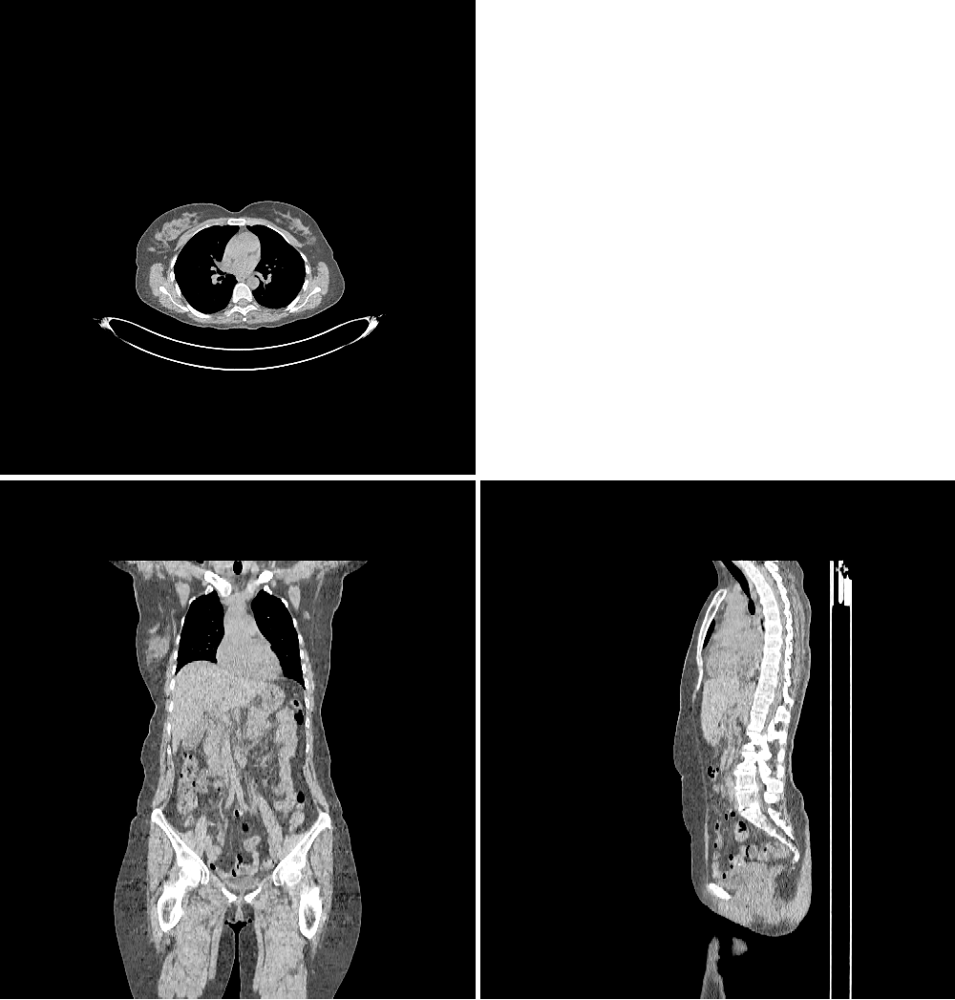

In [13]:
vis = ImageVisualiser(ct, cut=[200,270,256], window=[-250, 500])
fig = vis.show()

In [14]:
pet[:,:,240:] = -1000

<IPython.core.display.Javascript object>


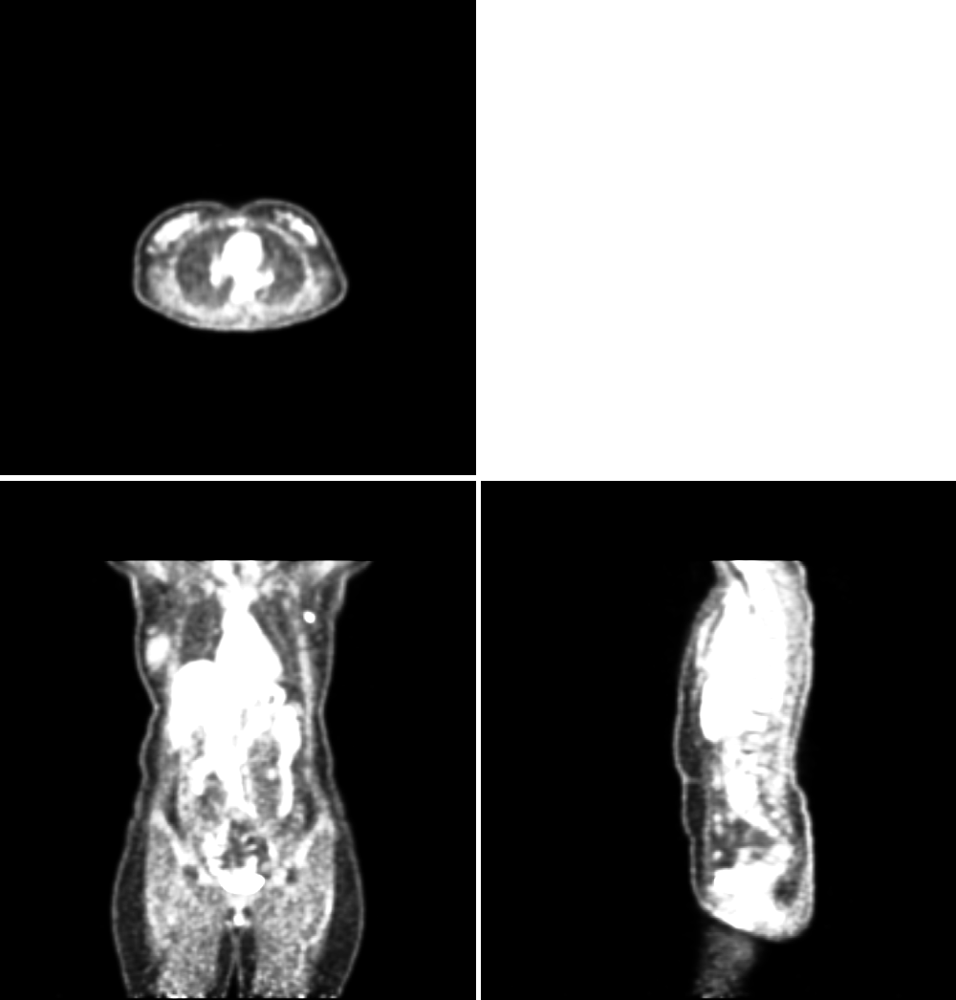

In [15]:
vis = ImageVisualiser(pet, cut=[200,270,256], window=[0, 3000])
fig = vis.show()

<IPython.core.display.Javascript object>


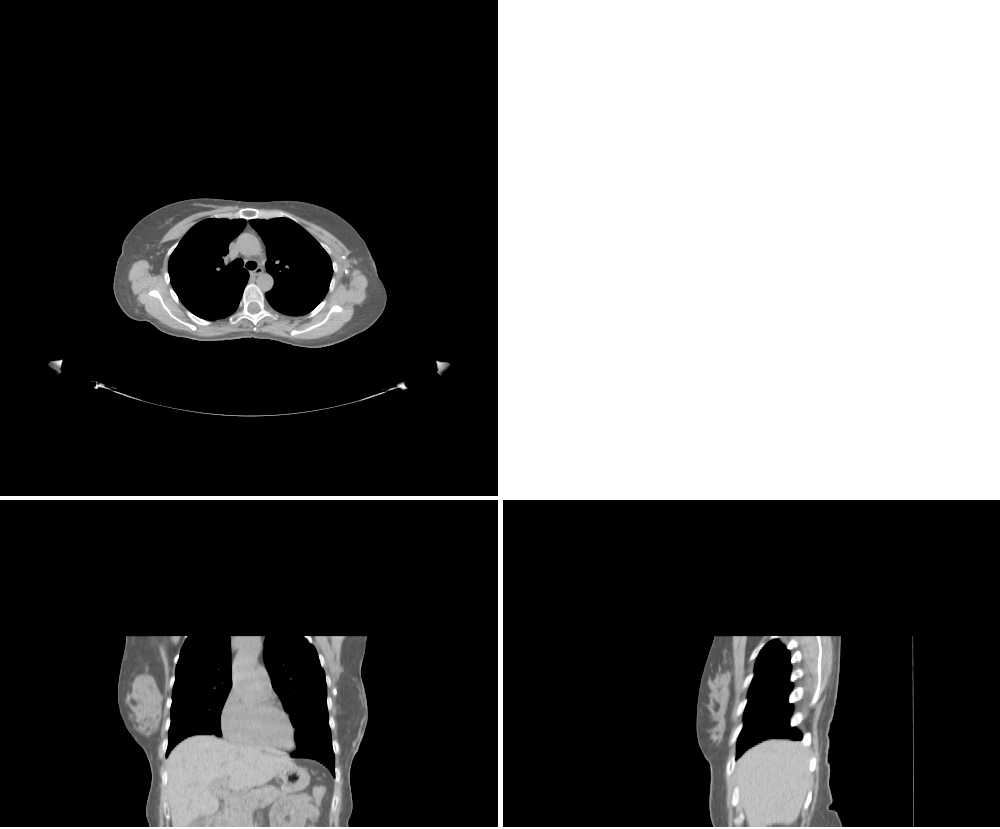

In [16]:
ct_plan[:,:,100:] = -1000
vis = ImageVisualiser(ct_plan, cut=[90,250,176], window=[-250, 500])
fig = vis.show()

In [17]:
image_ct_plan_to_0_rigid, tfm_plan_to_0_rigid = initial_registration(
    ct,
    ct_plan,
    options={
        'shrink_factors': [8,4],
        'smooth_sigmas': [0,0],
        'sampling_rate': 0.5,
        'final_interp': 2,
        'metric': 'mean_squares',
        'optimiser': 'gradient_descent_line_search',
        'number_of_iterations': 25},
    reg_method='Rigid')

In [18]:
image_ct_plan_to_0_dir, tfm_plan_to_0_dir = fast_symmetric_forces_demons_registration(
    ct,
    image_ct_plan_to_0_rigid,
    resolution_staging=[4,2],
    iteration_staging=[10,10]
)

<IPython.core.display.Javascript object>


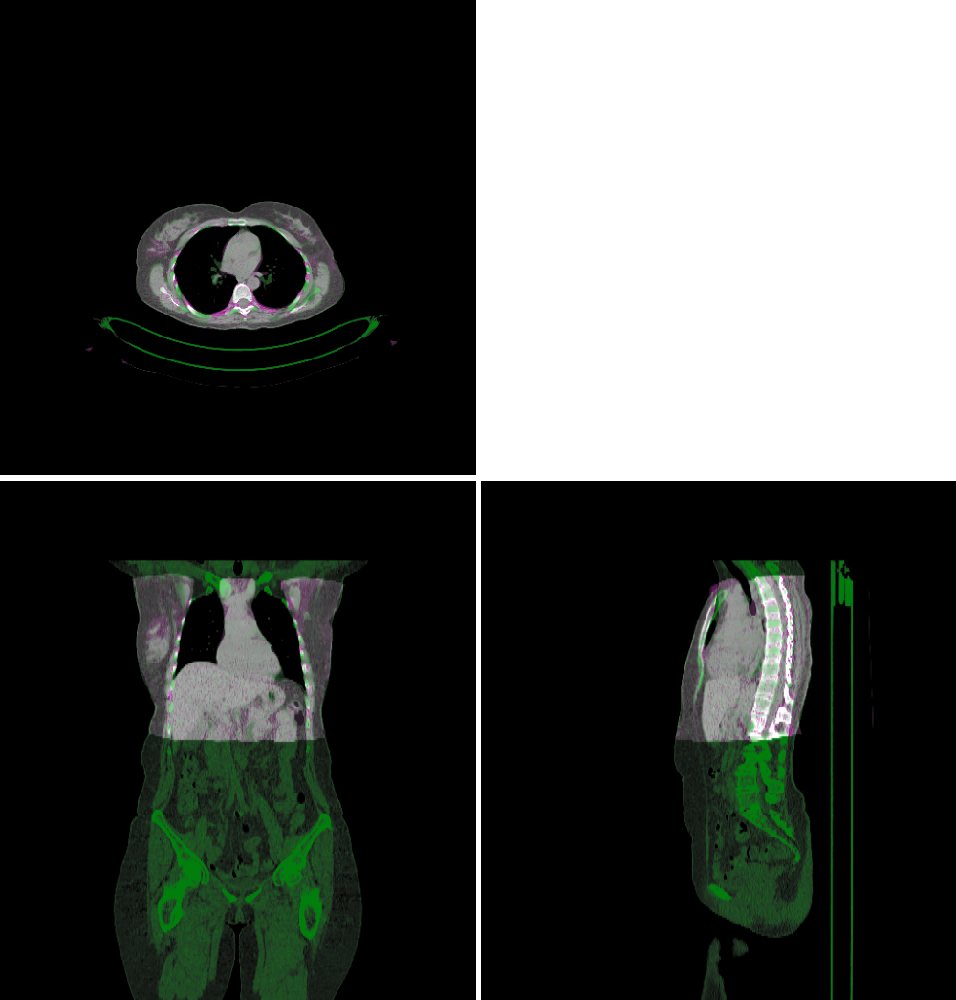

In [19]:
vis = ImageVisualiser(ct, cut=[200,270,256], window=[-250, 500])
vis.add_comparison_overlay(image_ct_plan_to_0_dir)
fig = vis.show()

In [20]:
contour_breast_plan_to_0_rigid = transform_propagation(
    ct,
    contour_breast_plan,
    tfm_plan_to_0_rigid,
    structure=True
)

contour_breast_plan_to_0_dir = apply_field(
    contour_breast_plan_to_0_rigid,
    tfm_plan_to_0_dir,
    structure=True
)

<IPython.core.display.Javascript object>


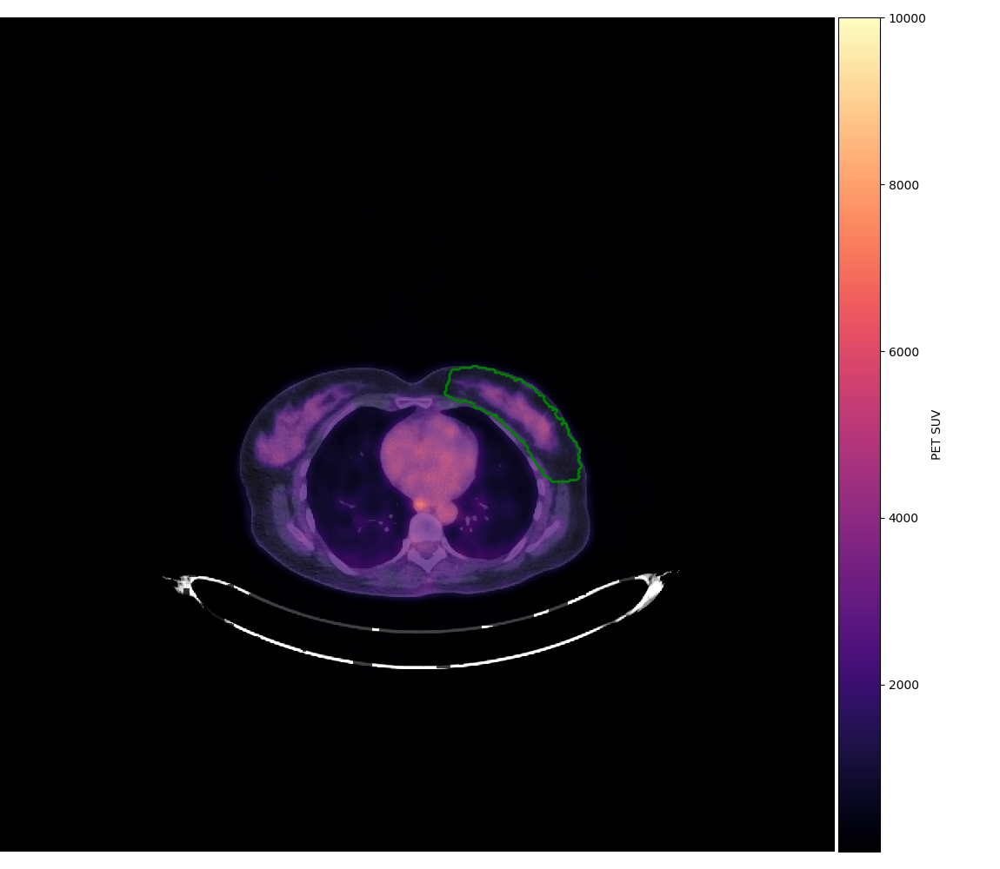

/home/alicja/.local/lib/python3.8/site-packages/platipy/imaging/visualisation/tools.py:1409: UserWarning: No contour levels were found within the data range.
  ax.contour(
/home/alicja/.local/lib/python3.8/site-packages/platipy/imaging/visualisation/tools.py:1409: UserWarning: The following kwargs were not used by contour: 'label'
  ax.contour(


In [21]:
vis = ImageVisualiser(ct, axis='z', cut=190, window=[-250, 500])
vis.add_scalar_overlay(pet, name='PET SUV', colormap=plt.cm.magma, min_value=0.1, max_value=10000)
vis.add_contour(contour_breast_plan_to_0_dir, name='BREAST', color='g')
fig = vis.show()

<IPython.core.display.Javascript object>


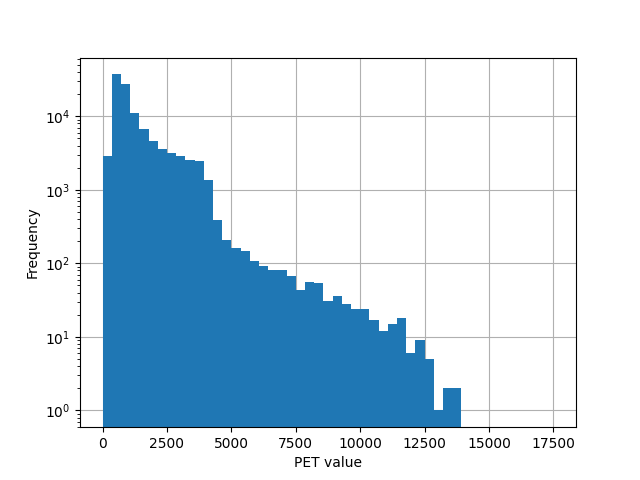

In [22]:
masked_pet_breast = sitk.Mask(pet, contour_breast_plan_to_0_dir)
sitk.WriteImage(masked_pet_breast, "masked_pet_rbreast_WES_005_4.nii.gz")

values = sitk.GetArrayViewFromImage(masked_pet_breast).flatten()

fig, ax = plt.subplots(1,1)
ax.hist(values, bins=np.linspace(1,17500,50), histtype='stepfilled', lw=2)
ax.set_yscale('log')
ax.grid()
ax.set_axisbelow(True)
ax.set_xlabel('PET value')
ax.set_ylabel('Frequency')
fig.show()

In [23]:
def mode1(x):
    values, counts = np.unique(x, return_counts=True)
    m = counts.argmax()
    return values[m], counts[m]
    
masked_pet_breast_arr=sitk.GetArrayFromImage(masked_pet_breast)
masked_pet_breast_arr=masked_pet_breast_arr.flatten()
masked_pet_breast_arr=np.rint(masked_pet_breast_arr)
mode=mode1(masked_pet_breast_arr[masked_pet_breast_arr>0])
p = np.percentile(masked_pet_breast_arr[masked_pet_breast_arr>0], 95) # return 95th percentile
max_val=np.max(masked_pet_breast_arr)

In [24]:
print(mode,p,max_val)

(550.0, 141) 3590.0 13847.0


In [4]:
from platipy.imaging.utils.tools import get_com

In [2]:
ct="/home/alicja/Documents/WES_006/IMAGES/WES_006_0_20180306_CT_10_PETCT_WBHDIN_ONC_3.nii.gz"
pet="/home/alicja/Documents/WES_006/IMAGES/WES_006_0_20180306_PT_AC_4.nii.gz"
ct_plan="/home/alicja/Documents/WES_006/IMAGES/WES_006_6_20181109_CT_3.nii.gz"
contour_breast_plan="/home/alicja/Documents/WES_006/STRUCTURES/WES_006_6_20181109_RTSTRUCT_COMBINED_SCFAX_4.nii.gz"

In [3]:
ct_plan=sitk.ReadImage(ct_plan)
contour_breast_plan=sitk.ReadImage(contour_breast_plan)
ct=sitk.ReadImage(ct)
pet_raw=sitk.ReadImage(pet)

<IPython.core.display.Javascript object>


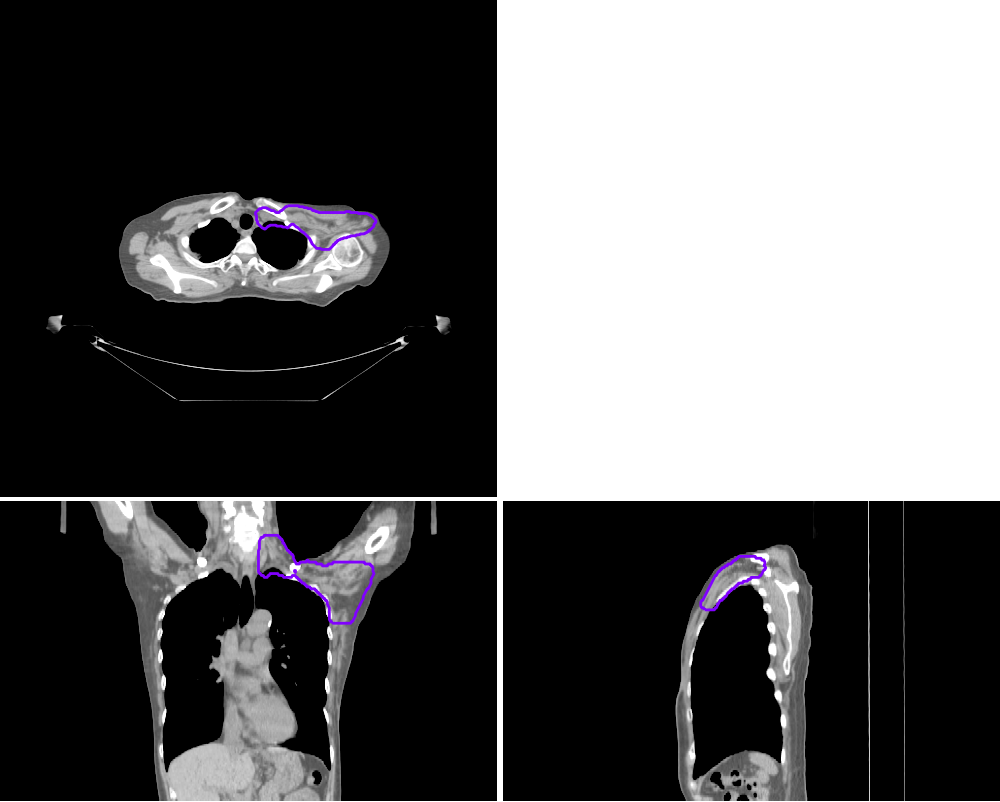

No contour levels were found within the data range.
No contour levels were found within the data range.
No contour levels were found within the data range.


In [5]:
vis = ImageVisualiser(ct_plan, cut=get_com(contour_breast_plan), window=[-250, 500])
vis.add_contour(contour_breast_plan)
fig = vis.show()

In [6]:
pet=sitk.Resample(pet_raw, ct)

#ct_plan = sitk.ReadImage(ct_plan)
#contour_breast_plan = sitk.ReadImage(contour_breast_plan)

<IPython.core.display.Javascript object>


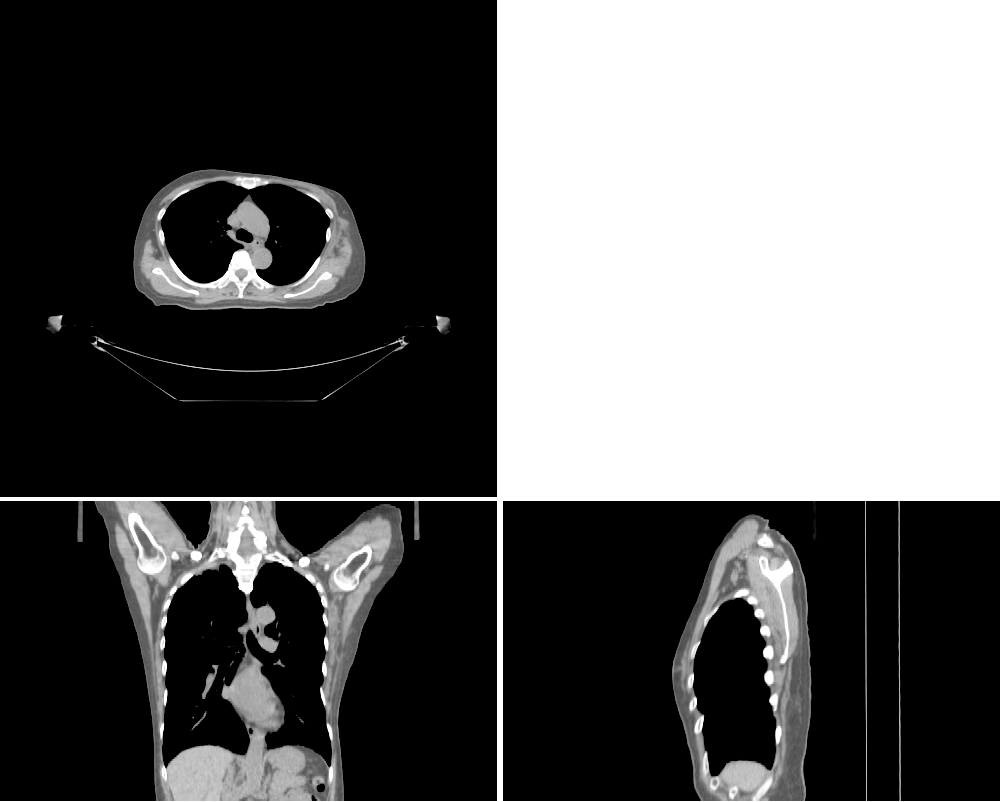

In [7]:
vis = ImageVisualiser(ct_plan, cut=[90,250,176], window=[-250, 500])
fig = vis.show()

In [8]:
image_ct_plan_to_0_rigid, tfm_plan_to_0_rigid = initial_registration(
    ct,
    ct_plan,
    options={
        'shrink_factors': [8,4],
        'smooth_sigmas': [0,0],
        'sampling_rate': 0.5,
        'final_interp': 2,
        'metric': 'mean_squares',
        'optimiser': 'gradient_descent_line_search',
        'number_of_iterations': 25},
    reg_method='Rigid')

In [9]:
image_ct_plan_to_0_dir, tfm_plan_to_0_dir = fast_symmetric_forces_demons_registration(
    ct,
    image_ct_plan_to_0_rigid,
    resolution_staging=[4,2],
    iteration_staging=[10,10]
)

<IPython.core.display.Javascript object>


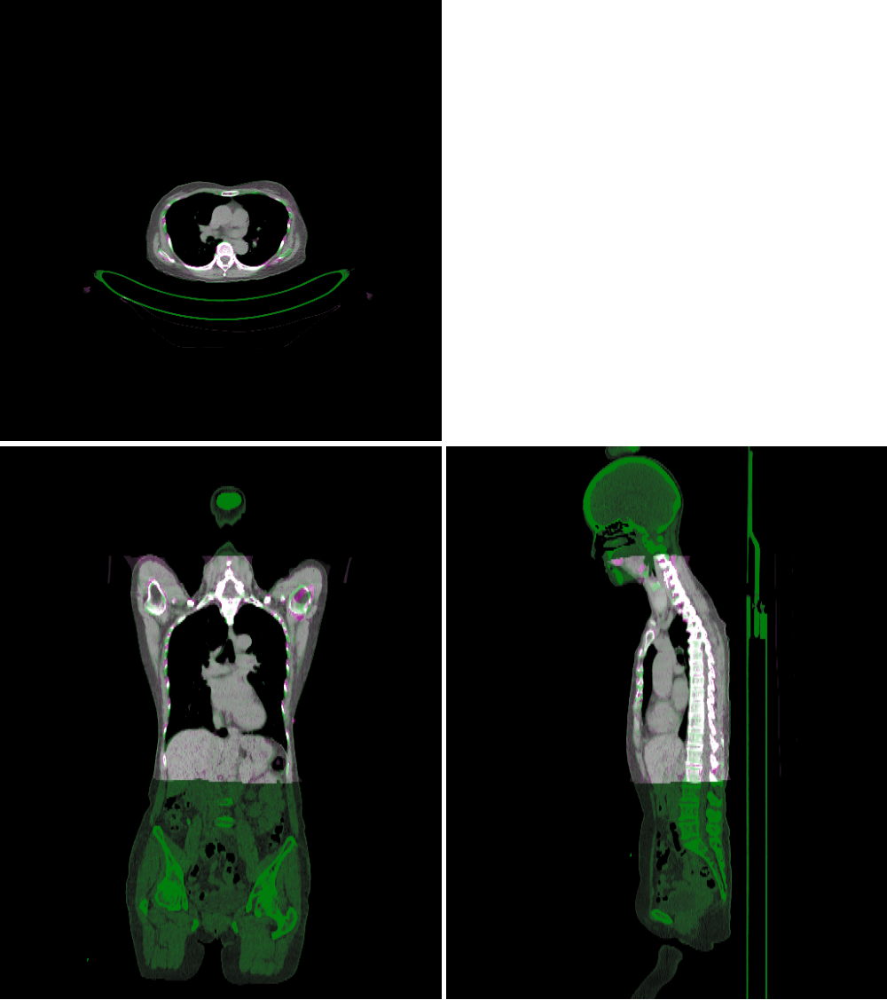

In [10]:
vis = ImageVisualiser(ct, cut=[190,270,256], window=[-250, 500])
vis.add_comparison_overlay(image_ct_plan_to_0_dir)
fig = vis.show()

In [11]:
contour_breast_plan_to_0_rigid = transform_propagation(
    ct,
    contour_breast_plan,
    tfm_plan_to_0_rigid,
    structure=True
)

contour_breast_plan_to_0_dir = apply_field(
    contour_breast_plan_to_0_rigid,
    tfm_plan_to_0_dir,
    structure=True
)

In [12]:
M_filter=sitk.MinimumMaximumImageFilter()
M_filter.Execute(contour_breast_plan_to_0_dir)
print(M_filter.GetMaximum())
print(M_filter.GetMinimum())

1.0
0.0


In [13]:
#pet=sitk.ReadImage(pet)
pet=sitk.Resample(pet,ct)

You have selected a single axis and multiple slice locations, attempting to match.


<IPython.core.display.Javascript object>


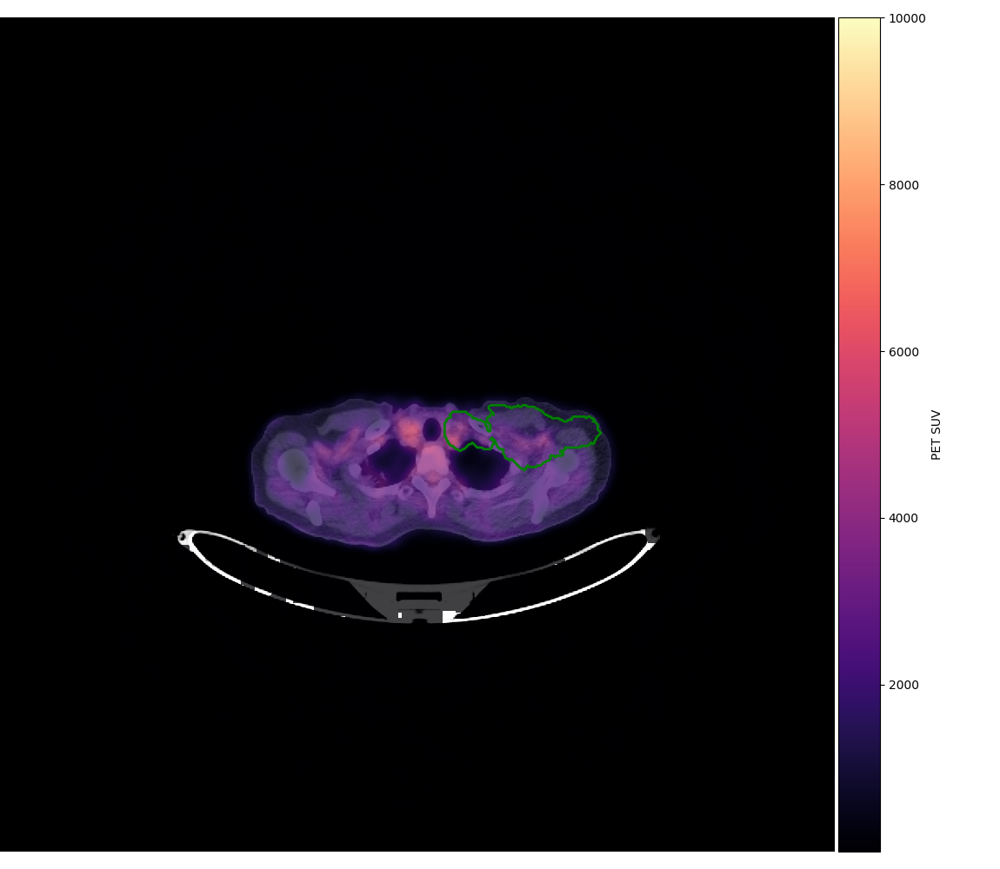

No contour levels were found within the data range.
The following kwargs were not used by contour: 'label'


In [14]:
vis = ImageVisualiser(ct, axis='z', cut=get_com(contour_breast_plan_to_0_dir), window=[-250, 500])
vis.add_scalar_overlay(pet, name='PET SUV', colormap=plt.cm.magma, min_value=0.1, max_value=10000)
vis.add_contour(contour_breast_plan_to_0_dir, name='BREAST', color='g')
fig = vis.show()

<IPython.core.display.Javascript object>


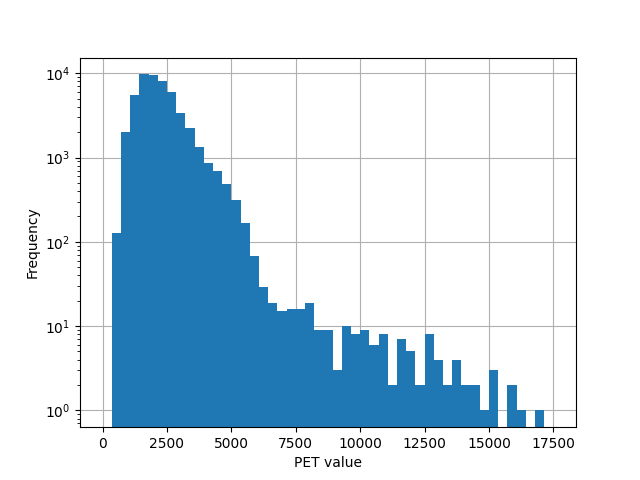

In [15]:
masked_pet_breast = sitk.Mask(pet, contour_breast_plan_to_0_dir)
sitk.WriteImage(masked_pet_breast,"masked_pet_rbreast_WES_006_0.nii.gz")

values = sitk.GetArrayViewFromImage(masked_pet_breast).flatten()

fig, ax = plt.subplots(1,1)
ax.hist(values, bins=np.linspace(1,17500,50), histtype='stepfilled', lw=2)
ax.set_yscale('log')
ax.grid()
ax.set_axisbelow(True)
ax.set_xlabel('PET value')
ax.set_ylabel('Frequency')
fig.show()

In [16]:
def mode1(x):
    values, counts = np.unique(x, return_counts=True)
    m = counts.argmax()
    return values[m], counts[m]
    
masked_pet_breast_arr=sitk.GetArrayFromImage(masked_pet_breast)
masked_pet_breast_arr=masked_pet_breast_arr.flatten()
masked_pet_breast_arr=np.rint(masked_pet_breast_arr)
mode=mode1(masked_pet_breast_arr[masked_pet_breast_arr>0])
p = np.percentile(masked_pet_breast_arr[masked_pet_breast_arr>0], 95) # return 95th percentile
max_val=np.max(masked_pet_breast_arr)

In [17]:
print(mode, p, max_val)

(1856.0, 46) 4023.8499999999985 16901.0


In [18]:
ct="/home/alicja/Documents/WES_006/IMAGES/WES_006_1_20180905_CT_10_PETCT_WBHDIN_ONC_3.nii.gz"
pet="/home/alicja/Documents/WES_006/IMAGES/WES_006_1_20180905_PT_AC_4.nii.gz"
ct_plan="/home/alicja/Documents/WES_006/IMAGES/WES_006_6_20181109_CT_3.nii.gz"
contour_breast_plan="/home/alicja/Documents/WES_006/STRUCTURES/WES_006_6_20181109_RTSTRUCT_COMBINED_SCFAX_4.nii.gz"

In [19]:
ct_plan=sitk.ReadImage(ct_plan)
contour_breast_plan=sitk.ReadImage(contour_breast_plan)
ct=sitk.ReadImage(ct)
pet_raw=sitk.ReadImage(pet)

<IPython.core.display.Javascript object>


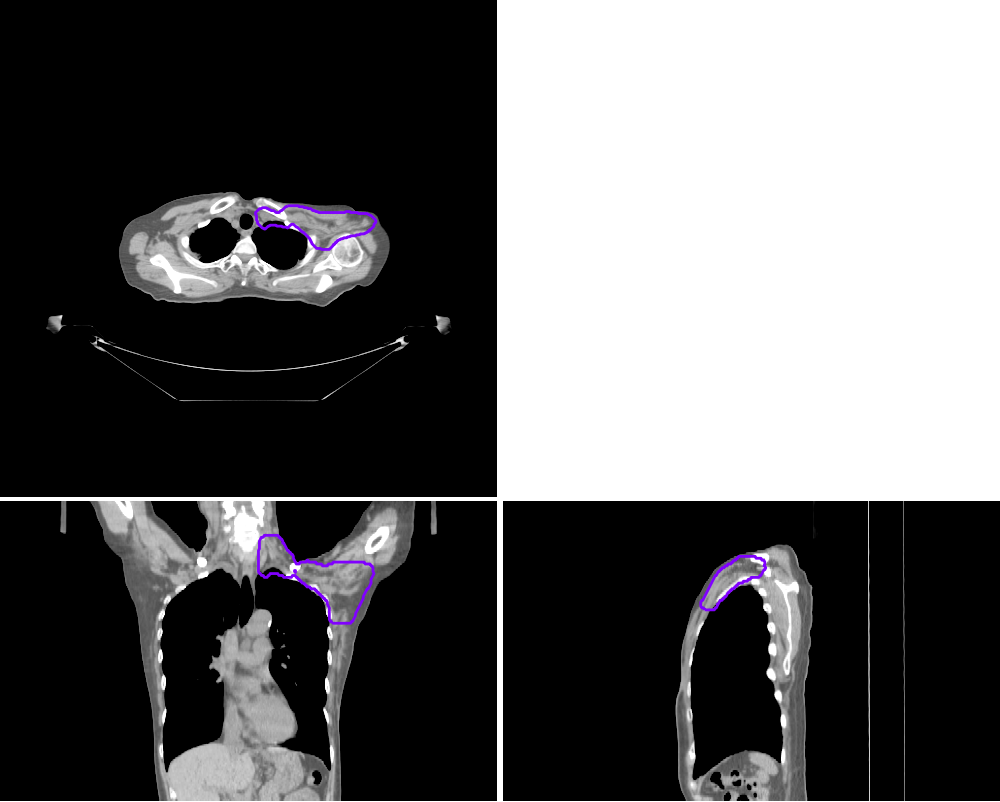

No contour levels were found within the data range.
No contour levels were found within the data range.
No contour levels were found within the data range.


In [20]:
vis = ImageVisualiser(ct_plan, cut=get_com(contour_breast_plan), window=[-250, 500])
vis.add_contour(contour_breast_plan)
fig = vis.show()

In [21]:
pet=sitk.Resample(pet_raw, ct)

<IPython.core.display.Javascript object>


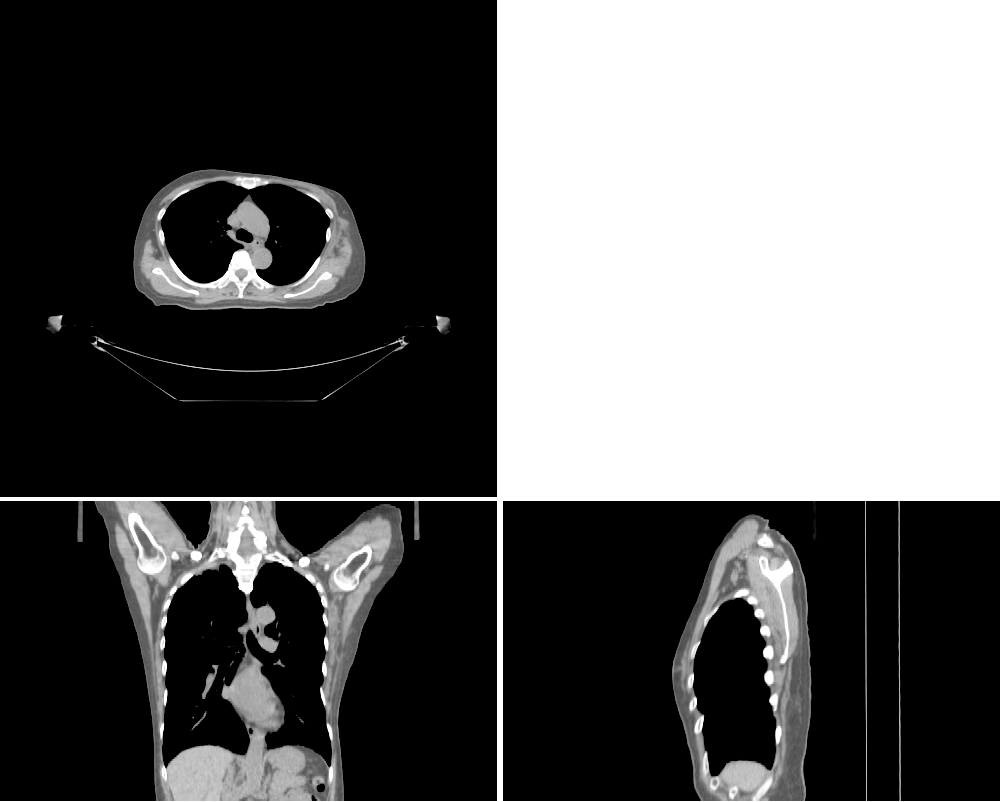

In [22]:
vis = ImageVisualiser(ct_plan, cut=[90,250,176], window=[-250, 500])
fig = vis.show()

In [23]:
image_ct_plan_to_0_rigid, tfm_plan_to_0_rigid = initial_registration(
    ct,
    ct_plan,
    options={
        'shrink_factors': [8,4],
        'smooth_sigmas': [0,0],
        'sampling_rate': 0.5,
        'final_interp': 2,
        'metric': 'mean_squares',
        'optimiser': 'gradient_descent_line_search',
        'number_of_iterations': 25},
    reg_method='Rigid')

In [24]:
image_ct_plan_to_0_dir, tfm_plan_to_0_dir = fast_symmetric_forces_demons_registration(
    ct,
    image_ct_plan_to_0_rigid,
    resolution_staging=[4,2],
    iteration_staging=[10,10]
)

<IPython.core.display.Javascript object>


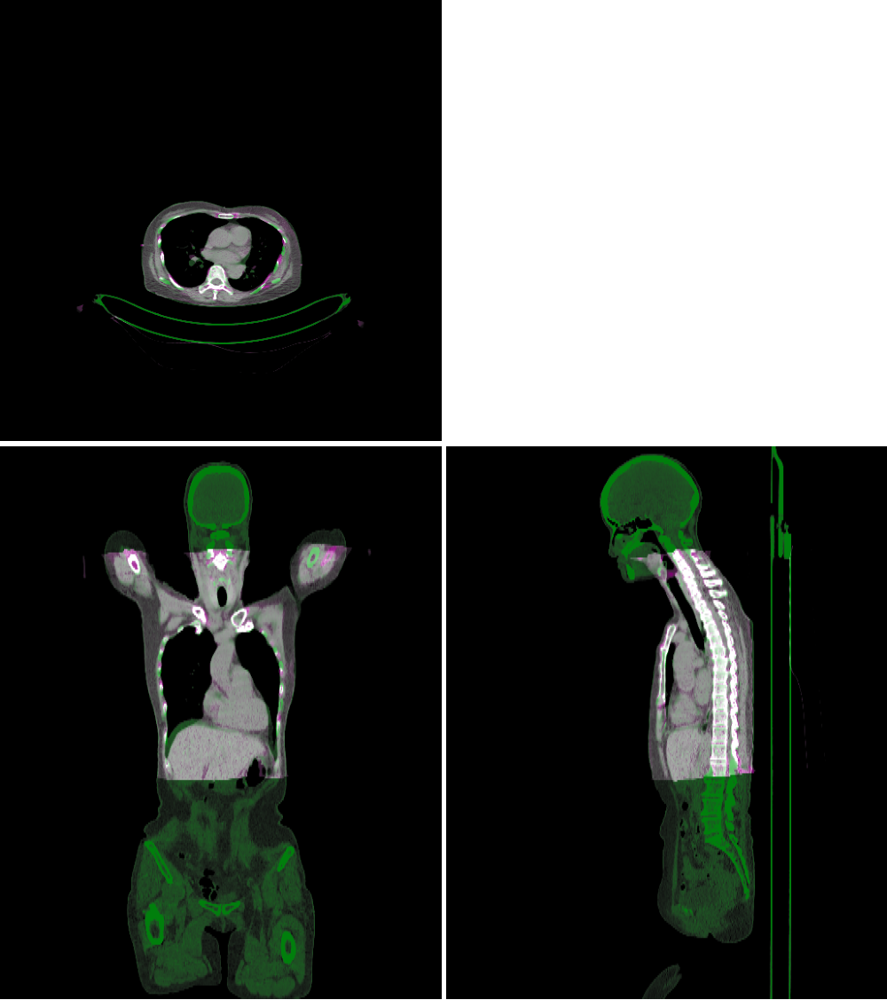

In [25]:
vis = ImageVisualiser(ct, cut=[190,270,256], window=[-250, 500])
vis.add_comparison_overlay(image_ct_plan_to_0_dir)
fig = vis.show()

In [26]:
contour_breast_plan_to_0_rigid = transform_propagation(
    ct,
    contour_breast_plan,
    tfm_plan_to_0_rigid,
    structure=True
)

contour_breast_plan_to_0_dir = apply_field(
    contour_breast_plan_to_0_rigid,
    tfm_plan_to_0_dir,
    structure=True
)

You have selected a single axis and multiple slice locations, attempting to match.


<IPython.core.display.Javascript object>


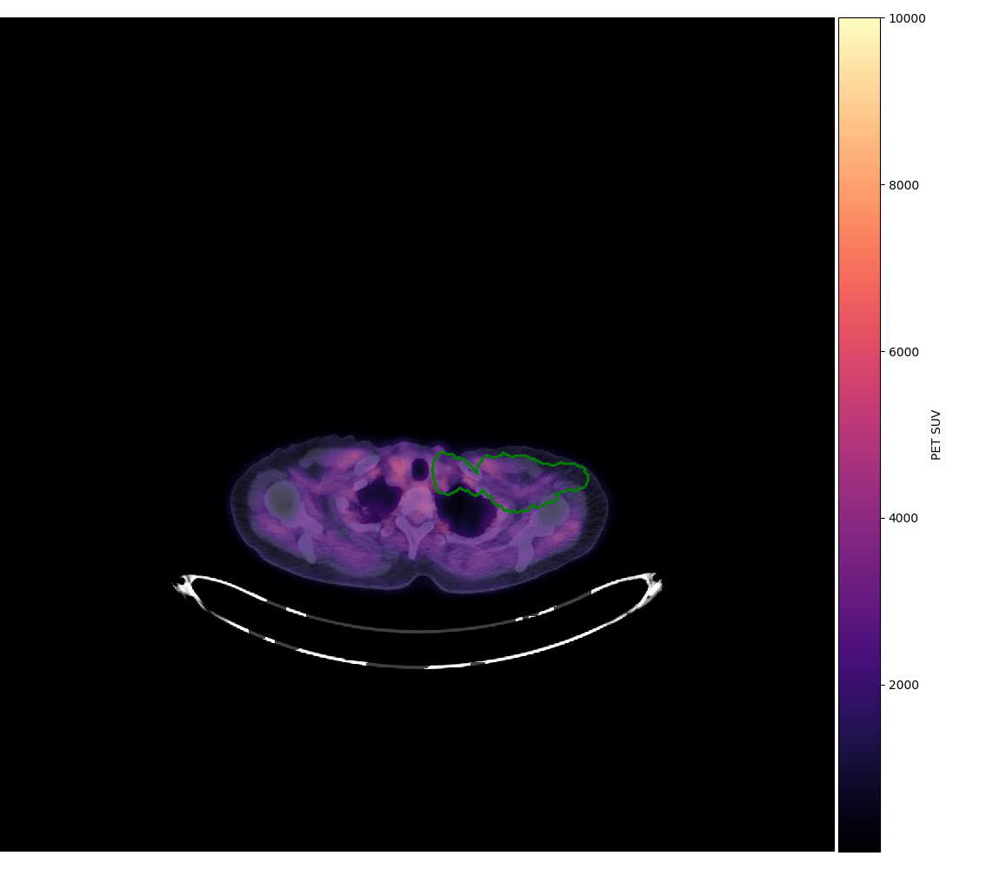

No contour levels were found within the data range.
The following kwargs were not used by contour: 'label'


In [27]:
vis = ImageVisualiser(ct, axis='z', cut=get_com(contour_breast_plan_to_0_dir), window=[-250, 500])
vis.add_scalar_overlay(pet, name='PET SUV', colormap=plt.cm.magma, min_value=0.1, max_value=10000)
vis.add_contour(contour_breast_plan_to_0_dir, name='BREAST', color='g')
fig = vis.show()

<IPython.core.display.Javascript object>


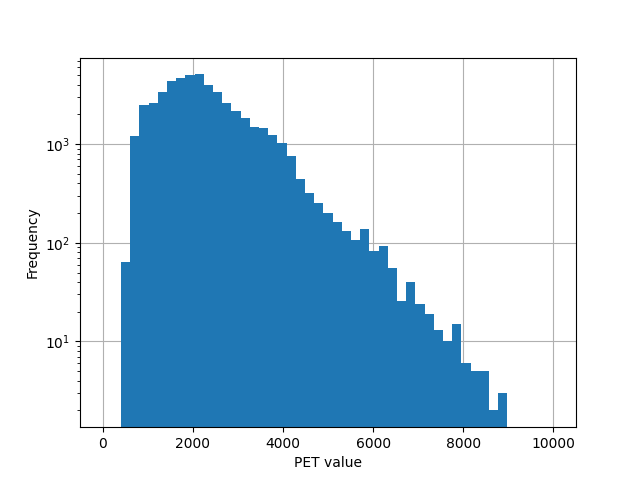

In [28]:
masked_pet_breast = sitk.Mask(pet, contour_breast_plan_to_0_dir)
sitk.WriteImage(masked_pet_breast,"masked_pet_rbreast_WES_006_1.nii.gz")

values = sitk.GetArrayViewFromImage(masked_pet_breast).flatten()

fig, ax = plt.subplots(1,1)
ax.hist(values, bins=np.linspace(1,10000,50), histtype='stepfilled', lw=2)
ax.set_yscale('log')
ax.grid()
ax.set_axisbelow(True)
ax.set_xlabel('PET value')
ax.set_ylabel('Frequency')
fig.show()

In [29]:
def mode1(x):
    values, counts = np.unique(x, return_counts=True)
    m = counts.argmax()
    return values[m], counts[m]

In [30]:
masked_pet_breast_arr=sitk.GetArrayFromImage(masked_pet_breast)
masked_pet_breast_arr=masked_pet_breast_arr.flatten()
masked_pet_breast_arr=np.rint(masked_pet_breast_arr)
mode=mode1(masked_pet_breast_arr[masked_pet_breast_arr>0])
p = np.percentile(masked_pet_breast_arr[masked_pet_breast_arr>0], 95) # return 95th percentile
max_val=np.max(masked_pet_breast_arr)

print(mode,p,max_val)

(2130.0, 41) 4161.949999999997 8966.0


In [31]:
ct="/home/alicja/Documents/WES_006/IMAGES/WES_006_3_20180417_CT_10_PETCT_WBHDIN_ONC_3.nii.gz"
pet="/home/alicja/Documents/WES_006/IMAGES/WES_006_3_20180417_PT_AC_4.nii.gz"
ct_plan="/home/alicja/Documents/WES_006/IMAGES/WES_006_6_20181109_CT_3.nii.gz"
contour_breast_plan="/home/alicja/Documents/WES_006/STRUCTURES/WES_006_6_20181109_RTSTRUCT_COMBINED_SCFAX_4.nii.gz"

In [32]:
ct_plan=sitk.ReadImage(ct_plan)
contour_breast_plan=sitk.ReadImage(contour_breast_plan)
ct=sitk.ReadImage(ct)
pet_raw=sitk.ReadImage(pet)

<IPython.core.display.Javascript object>


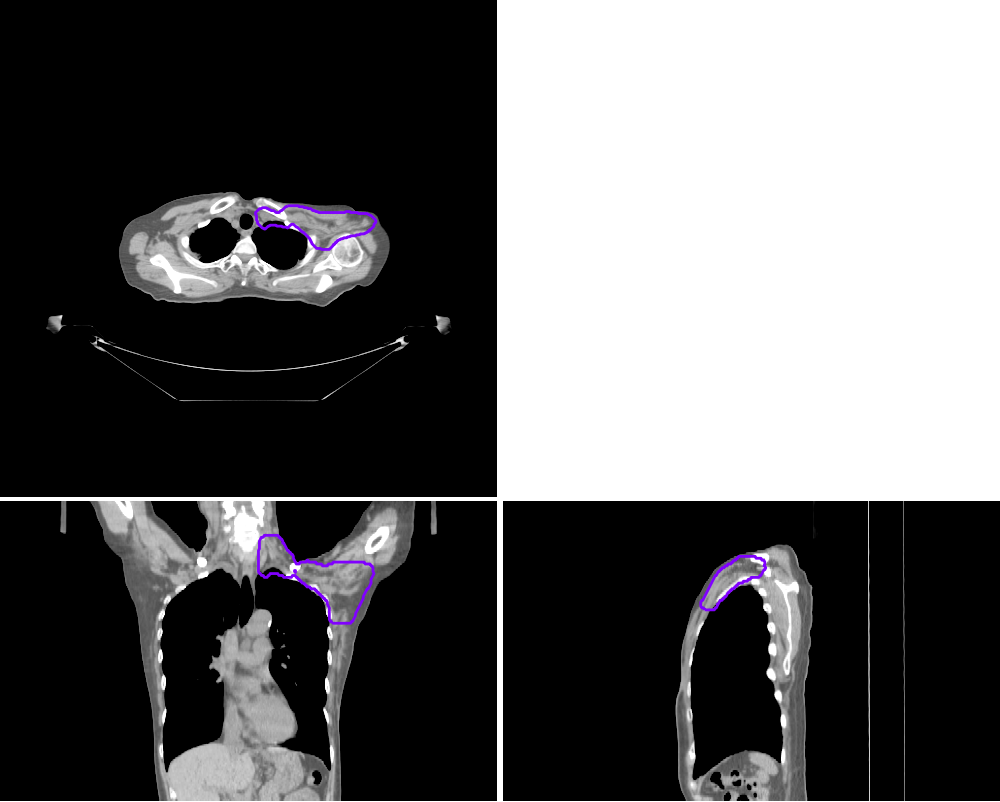

No contour levels were found within the data range.
No contour levels were found within the data range.
No contour levels were found within the data range.


In [33]:
vis = ImageVisualiser(ct_plan, cut=get_com(contour_breast_plan), window=[-250, 500])
vis.add_contour(contour_breast_plan)
fig = vis.show()

In [34]:
pet=sitk.Resample(pet_raw, ct)

<IPython.core.display.Javascript object>


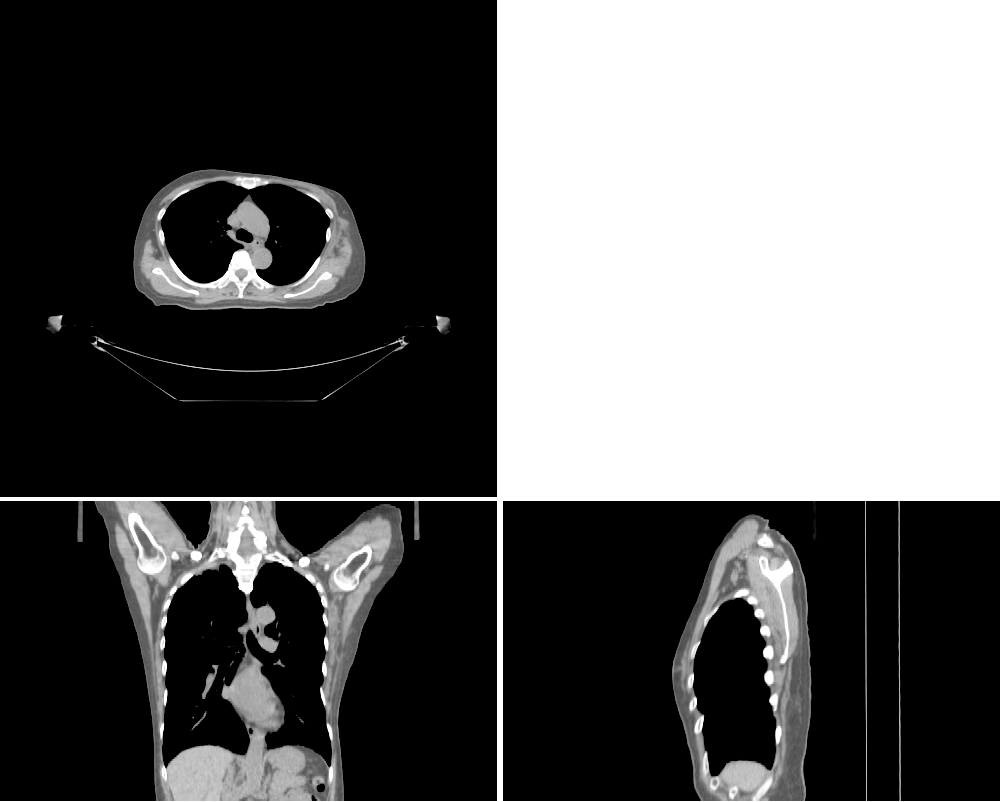

In [35]:
vis = ImageVisualiser(ct_plan, cut=[90,250,176], window=[-250, 500])
fig = vis.show()

In [36]:
image_ct_plan_to_0_rigid, tfm_plan_to_0_rigid = initial_registration(
    ct,
    ct_plan,
    options={
        'shrink_factors': [8,4],
        'smooth_sigmas': [0,0],
        'sampling_rate': 0.5,
        'final_interp': 2,
        'metric': 'mean_squares',
        'optimiser': 'gradient_descent_line_search',
        'number_of_iterations': 25},
    reg_method='Rigid')

In [37]:
image_ct_plan_to_0_dir, tfm_plan_to_0_dir = fast_symmetric_forces_demons_registration(
    ct,
    image_ct_plan_to_0_rigid,
    resolution_staging=[4,2],
    iteration_staging=[10,10]
)

<IPython.core.display.Javascript object>


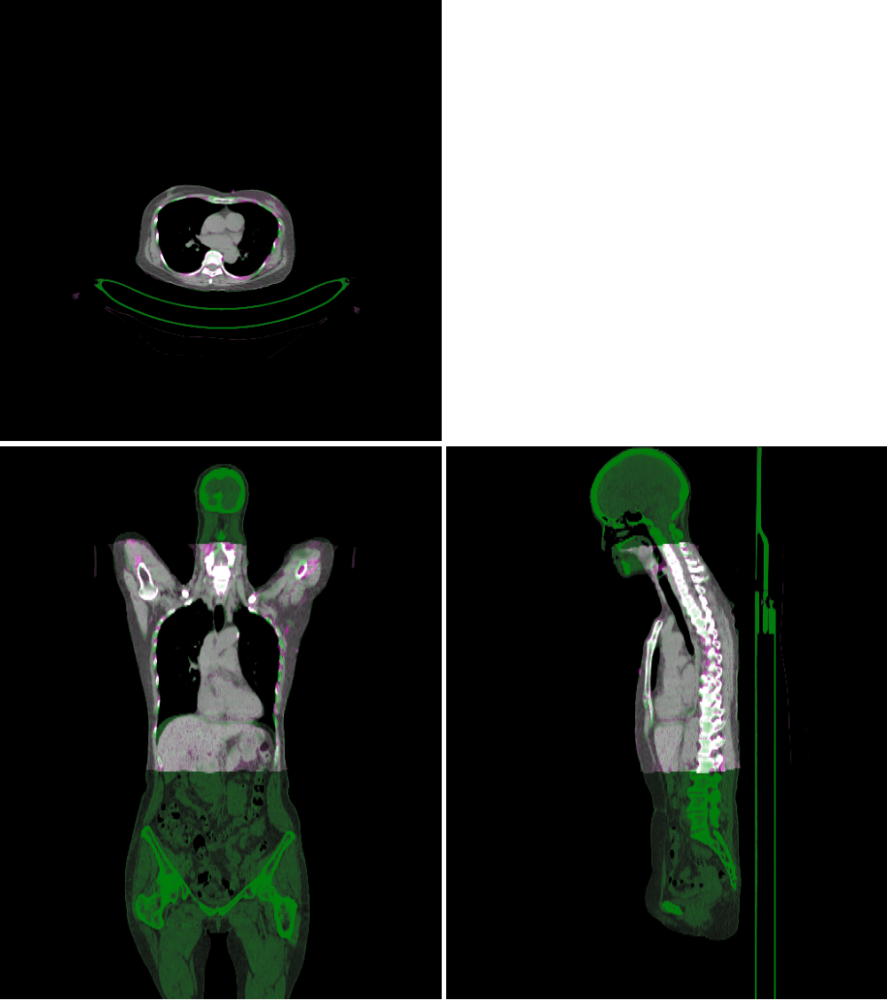

In [38]:
vis = ImageVisualiser(ct, cut=[190,270,256], window=[-250, 500])
vis.add_comparison_overlay(image_ct_plan_to_0_dir)
fig = vis.show()

In [39]:
contour_breast_plan_to_0_rigid = transform_propagation(
    ct,
    contour_breast_plan,
    tfm_plan_to_0_rigid,
    structure=True
)

contour_breast_plan_to_0_dir = apply_field(
    contour_breast_plan_to_0_rigid,
    tfm_plan_to_0_dir,
    structure=True
)

You have selected a single axis and multiple slice locations, attempting to match.


<IPython.core.display.Javascript object>


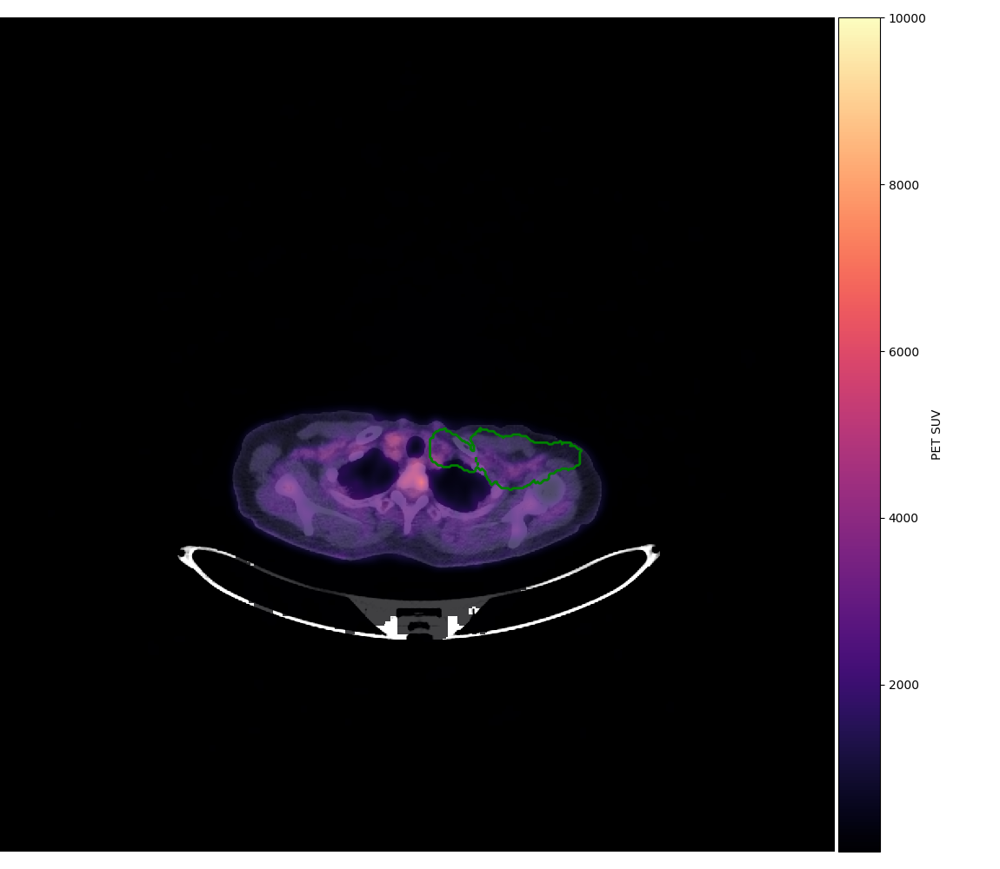

No contour levels were found within the data range.
The following kwargs were not used by contour: 'label'


In [40]:
vis = ImageVisualiser(ct, axis='z', cut=get_com(contour_breast_plan_to_0_dir), window=[-250, 500])
vis.add_scalar_overlay(pet, name='PET SUV', colormap=plt.cm.magma, min_value=0.1, max_value=10000)
vis.add_contour(contour_breast_plan_to_0_dir, name='BREAST', color='g')
fig = vis.show()

<IPython.core.display.Javascript object>


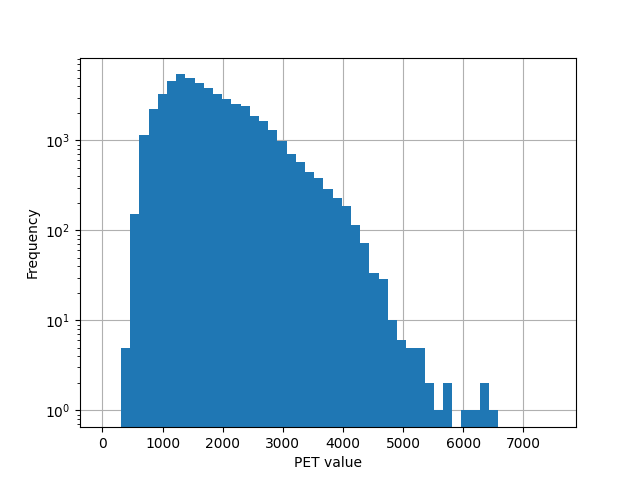

In [41]:
masked_pet_breast = sitk.Mask(pet, contour_breast_plan_to_0_dir)
sitk.WriteImage(masked_pet_breast,"masked_pet_rbreast_WES_006_3.nii.gz")

values = sitk.GetArrayViewFromImage(masked_pet_breast).flatten()

fig, ax = plt.subplots(1,1)
ax.hist(values, bins=np.linspace(1,7500,50), histtype='stepfilled', lw=2)
ax.set_yscale('log')
ax.grid()
ax.set_axisbelow(True)
ax.set_xlabel('PET value')
ax.set_ylabel('Frequency')
fig.show()

In [42]:
def mode1(x):
    values, counts = np.unique(x, return_counts=True)
    m = counts.argmax()
    return values[m], counts[m]

In [43]:
masked_pet_breast_arr=sitk.GetArrayFromImage(masked_pet_breast)
masked_pet_breast_arr=masked_pet_breast_arr.flatten()
masked_pet_breast_arr=np.rint(masked_pet_breast_arr)
mode=mode1(masked_pet_breast_arr[masked_pet_breast_arr>0])
p = np.percentile(masked_pet_breast_arr[masked_pet_breast_arr>0], 95) # return 95th percentile
max_val=np.max(masked_pet_breast_arr)

print(mode,p,max_val)

(1723.0, 54) 3192.0 6517.0


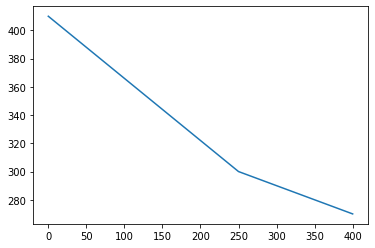

In [29]:
"""
Things to try:
- visualise the registration results at each time point for verification
- extract the mean and maximum (masked) PET image values at each time point
"""

days = [0, 250, 400]
values = [410, 300, 270]

fig, ax = plt.subplots(1,1)
ax.plot(days, values)
fig.show()